In [1]:
%load_ext autoreload
%autoreload 2
from decoder_utils import *
from pprint import pprint
import pickle
import pandas as pd
import seaborn as sns


In [2]:
pkl_file = open('CA3_beh_nday1_new_onePF_all.pkl', 'rb')
G_CA3 = pickle.load(pkl_file)
pkl_file.close()

In [3]:
session_type=2
#train_range2 = (82, 122)
#test_range2 = (61,81)
#valid_range2 = (135,145 )
validation_lap_num=50
train_lap_num=40
test_lap_num=5
valid_lap_num=5
# train_range = (60, 100)
# test_range = (1,59)
# valid_range = (100,109 )
bins_before=6 #How many bins of neural data prior to the output are used for decoding
bins_current=1 #Whether to use concurrent time bin of neural data
bins_after=6 #How many bins of neural data after the output are used for decoding
group_bin=100
bin_num=50

start 36
poses 0.006908162107467652 0.6435822112655639
start 36
poses 0.007254070212841034 0.643158296409183
start 36
poses 0.007264243980646134 0.6433176858520507
start 40
poses 0.006704686751365662 0.6430328153864542
start 40
poses 0.0079255388879776 0.6432057681973775
start 40
poses 0.007406676729917527 0.6429209076658884
start 34
poses 0.0059009590947628025 0.642768309841156
start 34
poses 0.007315112819671631 0.6426360471343994
start 34
poses 0.006267214735746384 0.642646219660441
start 32
poses 0.006959030946493149 0.6429615878359476
start 32
poses 0.0079458864235878 0.643460121084849
start 32
poses 0.0075084144079685215 0.6430633528327941
start 36
poses 0.0068132069412867235 0.6429412626520792
start 36
poses 0.006959030946493149 0.6427784624989827
start 36
poses 0.007040421088933945 0.6432973308658599
start 51
poses 0.0021875338459014892 0.6403164131736755
start 51
poses 0.0046902807259559635 0.6399959338998794
start 51
poses 0.004064594005942345 0.6409421129322052


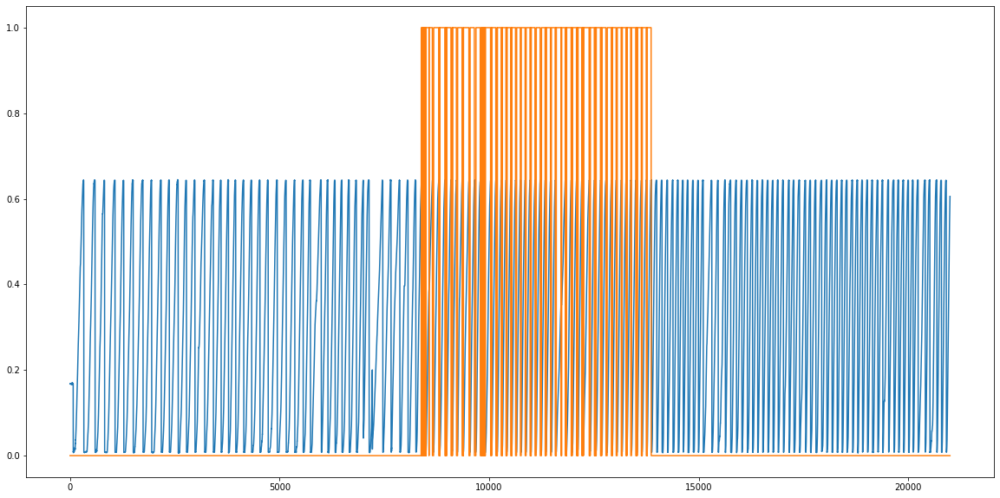

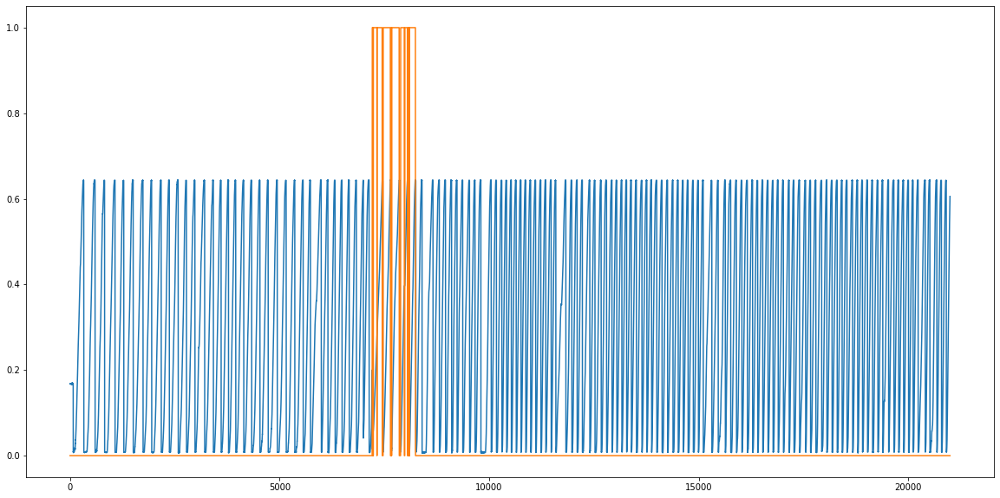

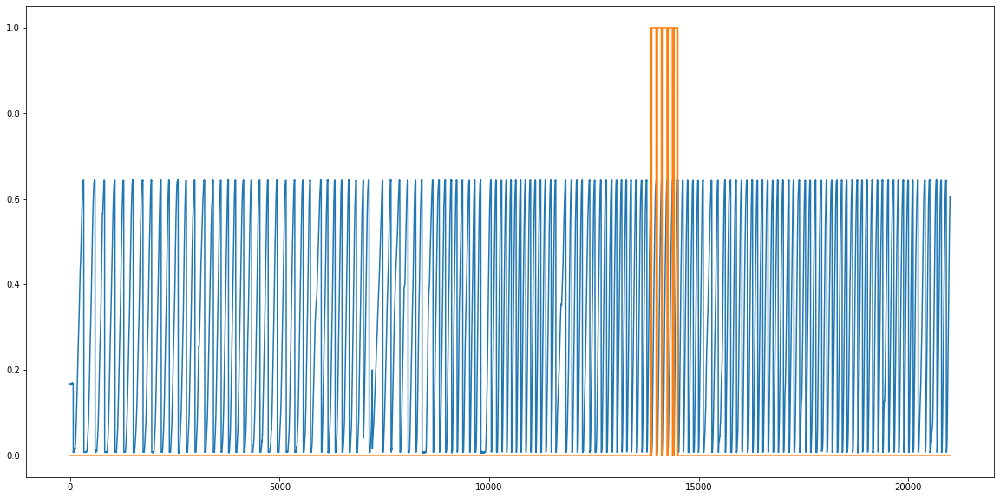

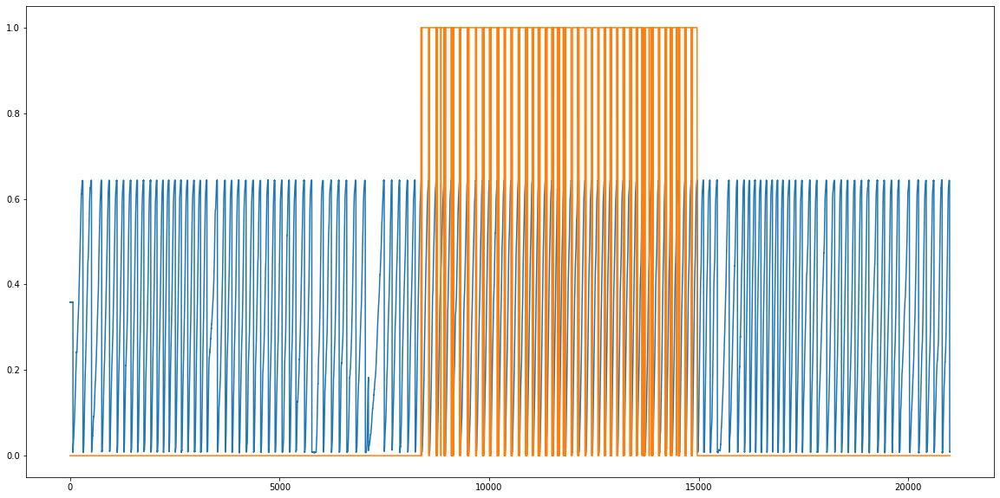

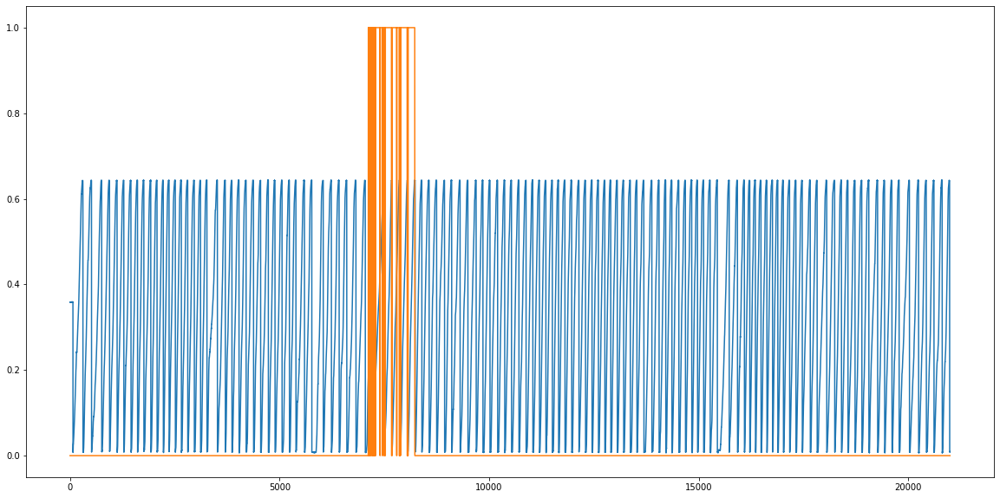

...

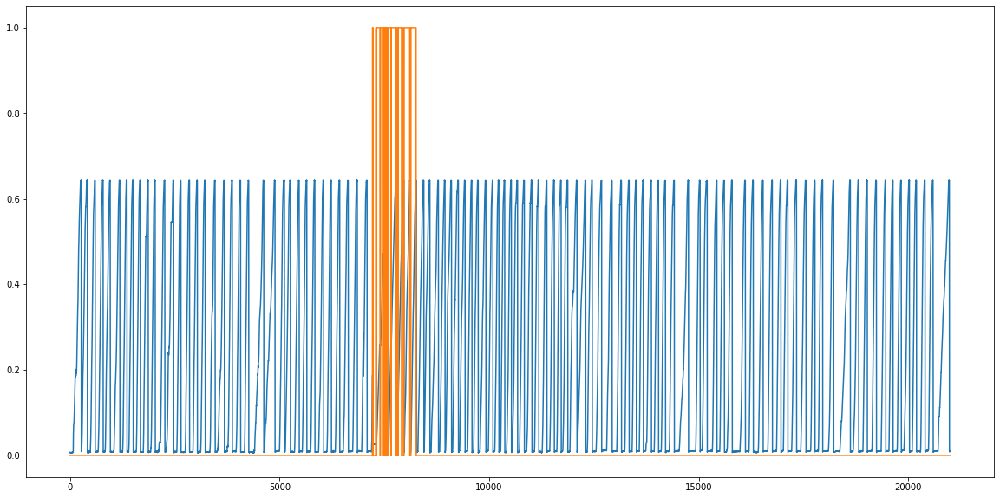

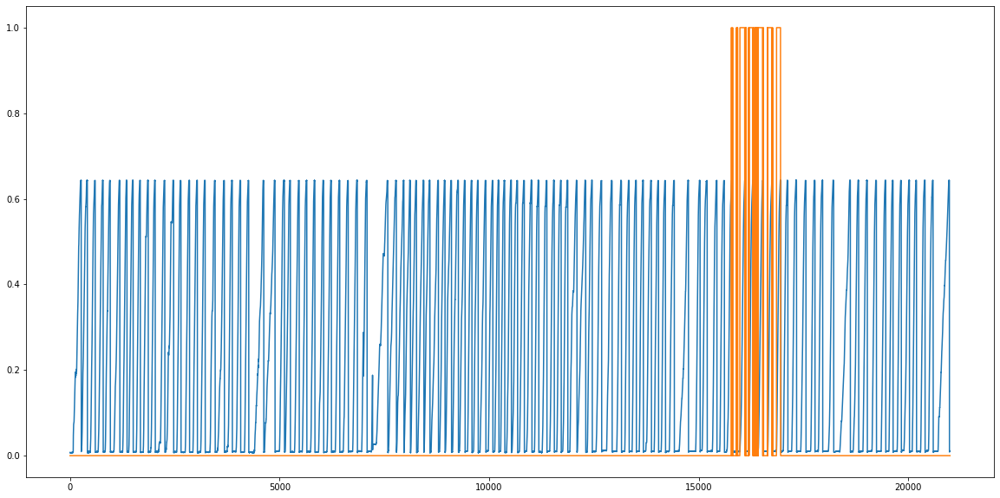

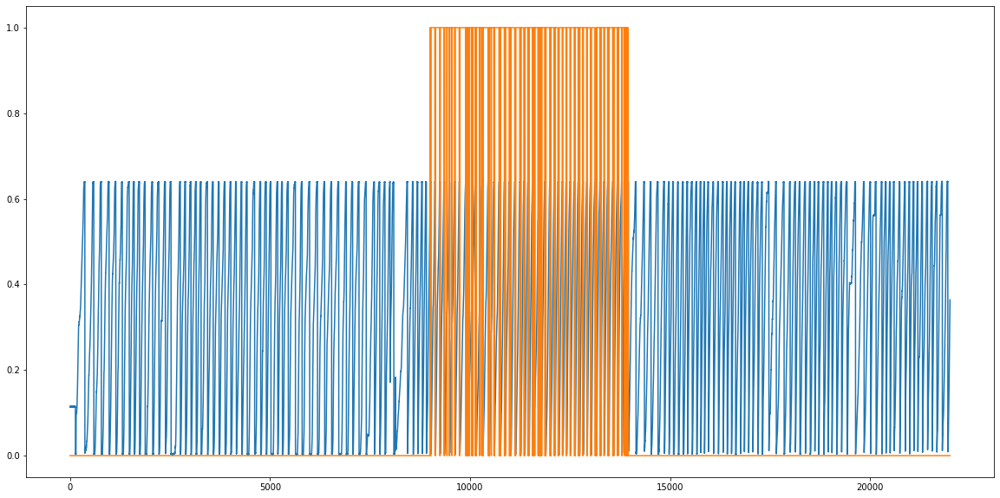

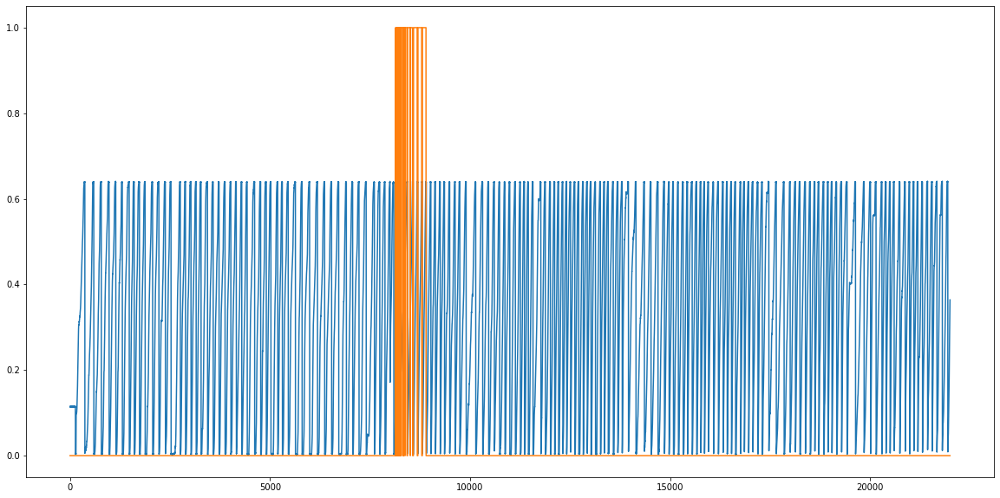

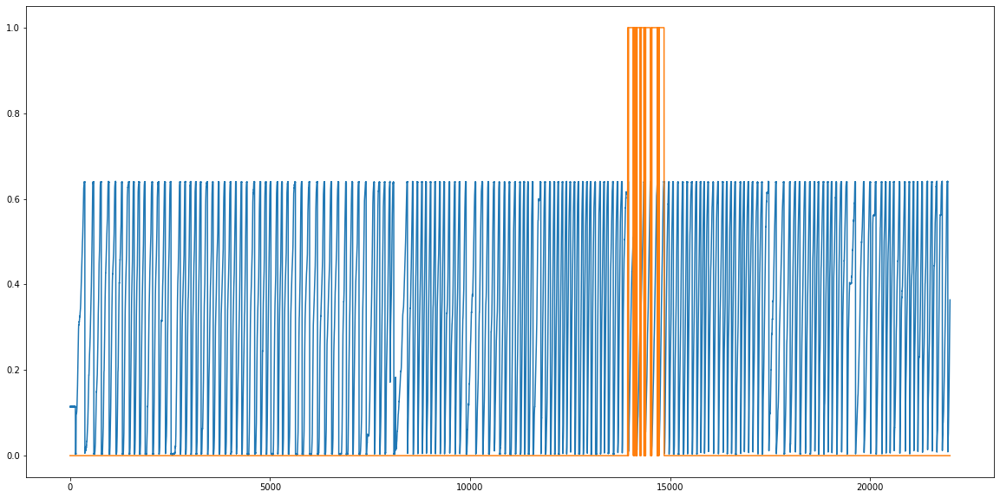

In [4]:
train_group_X=np.array([])
test_group_X=np.array([])
valid_group_X=np.array([])
PC_id=np.array([])
for key in G_CA3.keys():
    train_range=(G_CA3[key]['familiar_lap']+test_lap_num+1,G_CA3[key]['familiar_lap']+test_lap_num+train_lap_num+1)
    test_range=(G_CA3[key]['familiar_lap']+1,G_CA3[key]['familiar_lap']+test_lap_num+1)
    valid_range=(G_CA3[key]['familiar_lap']+test_lap_num+train_lap_num+1,G_CA3[key]['familiar_lap']+test_lap_num+train_lap_num+valid_lap_num+1)
    
    exp=G_CA3[key]['exp']
    pc_id=exp['PC_id']
    
    X_train,y_train,traingroup_X,train_group_pos = get_act_pos_group2(exp, bins_before,bins_after,group_bin,session_type,bin_num,train_range)
    X_test,y_test,testgroup_X,test_group_pos = get_act_pos_group2(exp, bins_before,bins_after,group_bin,2,bin_num,test_range)
    X_valid,y_valid,validgroup_X,valid_group_pos = get_act_pos_group2(exp, bins_before,bins_after,group_bin,session_type,bin_num,valid_range)
    #test_group_pos[0:8]=1
    train_group_X = np.hstack((train_group_X, traingroup_X)) if train_group_X.size else traingroup_X
    test_group_X = np.hstack((test_group_X, testgroup_X)) if test_group_X.size else testgroup_X
    valid_group_X = np.hstack((valid_group_X, validgroup_X))if valid_group_X.size else validgroup_X
    PC_id = np.hstack((PC_id, pc_id))if PC_id.size else pc_id
    

In [5]:
X=get_spikes_with_history(train_group_X,bins_before,bins_after,bins_current)
X_v=get_spikes_with_history(valid_group_X,bins_before,bins_after,bins_current)
X_t=get_spikes_with_history(test_group_X,bins_before,bins_after,bins_current)

le = LabelEncoder()
y_lst=[[i] for i in train_group_pos]
y_valid_lst=[[i] for i in valid_group_pos]
y_test_lst=[[i] for i in test_group_pos]

ohe = OneHotEncoder()
Y = ohe.fit_transform(y_lst).toarray()
Y_valid=ohe.fit_transform(y_valid_lst).toarray()
Y_test=ohe.fit_transform(y_test_lst).toarray()

#print(X_valid.shape)
print(X.shape)
print(X_v.shape)
print(X_t.shape)
print(np.sum(PC_id))

(4012, 13, 1096)
(512, 13, 1096)
(512, 13, 1096)
248


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

In [6]:
PC_num_list=240 #np.arange(40,201,40)
trail_num=10;
score=np.zeros([trail_num,1])
diff=np.zeros([trail_num,1])
epoch_data_result=[]
for i in range (1):
    for trail in range(trail_num):
            PC_num=PC_num_list
            nonPC_num=0 #600
            PC_X=X[:,:,PC_id==True]
            PC_X_v=X_v[:,:,PC_id==True]
            PC_X_t=X_t[:,:,PC_id==True]


            nPC_X=X[:,:,PC_id==False]
            nPC_X_v=X_v[:,:,PC_id==False]
            nPC_X_t=X_t[:,:,PC_id==False]

            X_random1,X_v_random1,X_t_random1=get_random_sample(PC_X,PC_X_v,PC_X_t,PC_num)
            X_random2,X_v_random2,X_t_random2=get_random_sample(nPC_X,nPC_X_v,nPC_X_t,nonPC_num)

            X_random=np.concatenate([X_random1,X_random2],axis=2)
            X_v_random=np.concatenate([X_v_random1,X_v_random2],axis=2)
            X_t_random=np.concatenate([X_t_random1,X_t_random2],axis=2)


            X_train_set = X_random[bins_before:-1-bins_after, :, :]
            Y_train_set = Y[bins_before:-1-bins_after, :]
            X_valid_set = X_v_random[bins_before:-1-bins_after, :, :]
            Y_valid_set = Y_valid[bins_before:-1-bins_after, :]
            X_test_set = X_t_random[bins_before:-1-bins_after, :, :]
            
            root_dir = r'..\Neural_Decoding\training_models'
            model_path = os.path.join(root_dir, 'ca3_1stlap_moretraining'+str(trail))
            os.makedirs(root_dir, exist_ok=True)
            
            LSTM_model=fit_LSTM(X_train_set, Y_train_set, X_valid_set, Y_valid_set,100, model_path, 
                      force=True)

            y_valid_predicted=LSTM_model.predict(X_valid_set)
            y_test_predicted=LSTM_model.predict(X_test_set)
            y_train_predicted=LSTM_model.predict(X_train_set)

            #Y = ohe.fit_transform(y_lst).toarray()
            #Y_valid=ohe.fit_transform(y_valid_lst).toarray()
            #Y_test=ohe.fit_transform(y_test_lst).toarray()

            y_valid_pre_inverse=ohe.inverse_transform(y_valid_predicted)
            y_test_pre_inverse=ohe.inverse_transform(y_test_predicted)

            score[trail,i] = sklearn.metrics.r2_score(valid_group_pos[bins_before:-bins_after-1], y_valid_pre_inverse)
            diff[trail,i] = sklearn.metrics.mean_absolute_error(valid_group_pos[bins_before:-bins_after-1], y_valid_pre_inverse)


            #np.save('ca1_nday1_'+str(trail)+'.npy', X_t_random) # save
            
            lap_s_v,lap_d_t,lap_abs_d_v=compute_lap_score(X_v_random, valid_group_pos,LSTM_model,bins_before,bins_after)
            lap_s_test,lap_d_test,lap_abs_d_test=compute_lap_score(X_t_random, test_group_pos,LSTM_model,bins_before,bins_after)
            lap_s_train,lap_d_train,lap_abs_d_train=compute_lap_score(X_random, train_group_pos,LSTM_model,bins_before,bins_after)

            epoch_data_result.append(dict(v_score=lap_s_v, v_diff=lap_d_t,v_abs_diff=lap_abs_d_v,
                                    test_score=lap_s_test, test_diff=lap_d_test,test_abs_diff=lap_abs_d_test,
                                    train_score=lap_s_train, train_diff=lap_d_train,train_abs_diff=lap_abs_d_train,
                                    trail=trail))

248
848
Train on 3999 samples, validate on 499 samples
Epoch 1/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0179 - accuracy: 0.2528
Epoch 2/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 0.0139 - accuracy: 0.4786
Epoch 3/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 0.0112 - accuracy: 0.6567
Epoch 4/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 0.0093 - accuracy: 0.7334s - loss: 0.0094 - accu
Epoch 5/100
3999/3999 [==============================] - 22s 5ms/sample - loss: 0.0078 - accuracy: 0.7704
Epoch 6/100
3999/3999 [==============================] - 22s 5ms/sample - loss: 0.0068 - accuracy: 0.7967
Epoch 7/100
3999/3999 [==============================] - 22s 5ms/sample - loss: 0.0059 - accuracy: 0.8275
Epoch 8/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 0.0052 - accuracy: 0.8470
Epoch 9/100
3999/3999 [==============================] - 23s 6ms/sample - 

Epoch 71/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 1.0681e-04 - accuracy: 0.9982
Epoch 72/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 9.4956e-05 - accuracy: 0.9980
Epoch 73/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 1.4041e-04 - accuracy: 0.9967
Epoch 74/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 9.6982e-05 - accuracy: 0.9980
Epoch 75/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 1.2366e-04 - accuracy: 0.9970
Epoch 76/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 1.3932e-04 - accuracy: 0.9970 3s - l
Epoch 77/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 7.8075e-05 - accuracy: 0.9992
Epoch 78/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 1.1185e-04 - accuracy: 0.9977s - loss: 1.2771e-04 - accuracy:  - ETA: 3s - loss: 1.2516e - ETA: 1s - loss: 1.1708e-0
Epoch 79/100
3999/

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)
[  5 105 205 305 405 495]
[  5 105 205 305 405 495]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

(101, 13, 240)
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

(111, 13, 240)
(111, 13, 240)

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)
(111, 13, 240)

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)
(111, 13, 240)

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)
(111, 13, 240)

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


248
848
Train on 3999 samples, validate on 499 samples
Epoch 1/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 0.0181 - accuracy: 0.2461
Epoch 2/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0139 - accuracy: 0.4889
Epoch 3/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0113 - accuracy: 0.6464
Epoch 4/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0094 - accuracy: 0.7302
Epoch 5/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0079 - accuracy: 0.7664
Epoch 6/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0067 - accuracy: 0.8065
Epoch 7/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0058 - accuracy: 0.8362
Epoch 8/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0051 - accuracy: 0.8507
Epoch 9/100
3999/3999 [==============================] - 22s 5ms/sample - loss: 0.0043 - accuracy

3999/3999 [==============================] - 22s 6ms/sample - loss: 1.2965e-04 - accuracy: 0.9970
Epoch 72/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 1.3994e-04 - accuracy: 0.9967
Epoch 73/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 1.3234e-04 - accuracy: 0.9975
Epoch 74/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 1.5229e-04 - accuracy: 0.9965
Epoch 75/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 9.9142e-05 - accuracy: 0.9982
Epoch 76/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 5.3577e-05 - accuracy: 0.9995
Epoch 77/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 6.9473e-05 - accuracy: 0.9995
Epoch 78/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 1.1148e-04 - accuracy: 0.9982
Epoch 79/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 1.3939e-04 - accuracy: 0.9975
Epoch 80/100
3

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)
[  5 105 205 305 405 495]
[  5 105 205 305 405 495]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a


[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
(111, 13, 240)
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


248
848
Train on 3999 samples, validate on 499 samples
Epoch 1/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0180 - accuracy: 0.2588
Epoch 2/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 0.0139 - accuracy: 0.4821
Epoch 3/100
3999/3999 [==============================] - 22s 6ms/sample - loss: 0.0113 - accuracy: 0.6389
Epoch 4/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 0.0092 - accuracy: 0.7464
Epoch 5/100
3999/3999 [==============================] - 22s 5ms/sample - loss: 0.0078 - accuracy: 0.7799
Epoch 6/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0068 - accuracy: 0.8030
Epoch 7/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0057 - accuracy: 0.8382
Epoch 8/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0051 - accuracy: 0.8522
Epoch 9/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 0.0045 - accuracy

3999/3999 [==============================] - 21s 5ms/sample - loss: 1.1602e-04 - accuracy: 0.9977
Epoch 73/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 8.9807e-05 - accuracy: 0.9985
Epoch 74/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 7.1477e-05 - accuracy: 0.9990
Epoch 75/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 1.6015e-04 - accuracy: 0.9965
Epoch 76/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 1.0750e-04 - accuracy: 0.9980
Epoch 77/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 1.2507e-04 - accuracy: 0.9972
Epoch 78/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 1.5517e-04 - accuracy: 0.9960
Epoch 79/100
3999/3999 [==============================] - 21s 5ms/sample - loss: 7.3379e-05 - accuracy: 0.9990
Epoch 80/100
3999/3999 [==============================] - 22s 5ms/sample - loss: 1.3622e-04 - accuracy: 0.9965 - val_loss: 0.

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[  5 105 205 305 405 495]
[  5 105 205 305 405 495]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


248
848
Train on 3999 samples, validate on 499 samples
Epoch 1/100
3999/3999 [==============================] - 26s 6ms/sample - loss: 0.0180 - accuracy: 0.2648
Epoch 2/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0139 - accuracy: 0.4874
Epoch 3/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0113 - accuracy: 0.6329
Epoch 4/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0094 - accuracy: 0.7249
Epoch 5/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0079 - accuracy: 0.7764
Epoch 6/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0068 - accuracy: 0.8110
Epoch 7/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0058 - accuracy: 0.8330
Epoch 8/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0051 - accuracy: 0.8555
Epoch 9/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0045 - accuracy

3999/3999 [==============================] - 24s 6ms/sample - loss: 2.1087e-04 - accuracy: 0.9947
Epoch 73/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.5318e-04 - accuracy: 0.9970
Epoch 74/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.1260e-04 - accuracy: 0.9977
Epoch 75/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.3053e-04 - accuracy: 0.9975
Epoch 76/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.3349e-04 - accuracy: 0.9972
Epoch 77/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.1118e-04 - accuracy: 0.9977
Epoch 78/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.2409e-04 - accuracy: 0.9970
Epoch 79/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.2654e-04 - accuracy: 0.9977
Epoch 80/100
3999/3999 [==============================] - 26s 6ms/sample - loss: 1.6934e-04 - accuracy: 0.9955 - val_loss: 0.

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[  5 105 205 305 405 495]
[  5 105 205 305 405 495]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


248
848
Train on 3999 samples, validate on 499 samples
Epoch 1/100
3999/3999 [==============================] - 26s 7ms/sample - loss: 0.0181 - accuracy: 0.2571
Epoch 2/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0138 - accuracy: 0.4881
Epoch 3/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0112 - accuracy: 0.6489
Epoch 4/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0092 - accuracy: 0.7314
Epoch 5/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0079 - accuracy: 0.7742
Epoch 6/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0068 - accuracy: 0.7937
Epoch 7/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0058 - accuracy: 0.8327
Epoch 8/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0052 - accuracy: 0.8470
Epoch 9/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 0.0045 - accuracy

3999/3999 [==============================] - 25s 6ms/sample - loss: 1.2812e-04 - accuracy: 0.9972
Epoch 73/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 1.2016e-04 - accuracy: 0.9982
Epoch 74/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 1.2799e-04 - accuracy: 0.9975
Epoch 75/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 1.6441e-04 - accuracy: 0.9965
Epoch 76/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 1.4965e-04 - accuracy: 0.9972
Epoch 77/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 1.2713e-04 - accuracy: 0.9972
Epoch 78/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 1.0724e-04 - accuracy: 0.9980
Epoch 79/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 1.4921e-04 - accuracy: 0.9965
Epoch 80/100
3999/3999 [==============================] - 26s 7ms/sample - loss: 9.5744e-05 - accuracy: 0.9985 - val_loss: 0.

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[  5 105 205 305 405 495]
[  5 105 205 305 405 495]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


248
848
Train on 3999 samples, validate on 499 samples
Epoch 1/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0181 - accuracy: 0.2491
Epoch 2/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 0.0139 - accuracy: 0.4826
Epoch 3/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 0.0112 - accuracy: 0.6454
Epoch 4/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 0.0093 - accuracy: 0.7307
Epoch 5/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 0.0079 - accuracy: 0.7634
Epoch 6/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 0.0066 - accuracy: 0.8085
Epoch 7/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 0.0057 - accuracy: 0.8312
Epoch 8/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 0.0050 - accuracy: 0.8552
Epoch 9/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 0.0045 - accuracy

Epoch 71/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 8.2170e-05 - accuracy: 0.9990
Epoch 72/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 8.8869e-05 - accuracy: 0.9990
Epoch 73/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 1.2143e-04 - accuracy: 0.9982
Epoch 74/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 1.6059e-04 - accuracy: 0.9970
Epoch 75/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 2.0118e-04 - accuracy: 0.9952
Epoch 76/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 1.2003e-04 - accuracy: 0.9972s - loss: 1.2206e-04 - accuracy: 
Epoch 77/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 9.9401e-05 - accuracy: 0.9980
Epoch 78/100
3999/3999 [==============================] - 23s 6ms/sample - loss: 1.3326e-04 - accuracy: 0.9972
Epoch 79/100
3999/3999 [==============================] - 23s 6ms/sample - loss

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[  5 105 205 305 405 495]
[  5 105 205 305 405 495]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


248
848
Train on 3999 samples, validate on 499 samples
Epoch 1/100
3999/3999 [==============================] - 28s 7ms/sample - loss: 0.0180 - accuracy: 0.2623
Epoch 2/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0138 - accuracy: 0.4859
Epoch 3/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0111 - accuracy: 0.6519
Epoch 4/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0092 - accuracy: 0.7304
Epoch 5/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0077 - accuracy: 0.7792
Epoch 6/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0067 - accuracy: 0.8060
Epoch 7/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0056 - accuracy: 0.8367
Epoch 8/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0049 - accuracy: 0.8615
Epoch 9/100
3999/3999 [==============================] - 25s 6ms/sample - loss: 0.0045 - accuracy

3999/3999 [==============================] - 24s 6ms/sample - loss: 1.6455e-04 - accuracy: 0.9970
Epoch 73/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.1728e-04 - accuracy: 0.9977
Epoch 74/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.1640e-04 - accuracy: 0.9977
Epoch 75/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 9.5998e-05 - accuracy: 0.9985
Epoch 76/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.3323e-04 - accuracy: 0.9975
Epoch 77/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.2828e-04 - accuracy: 0.9977
Epoch 78/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 1.1794e-04 - accuracy: 0.9972
Epoch 79/100
3999/3999 [==============================] - 24s 6ms/sample - loss: 9.2858e-05 - accuracy: 0.9985
Epoch 80/100
3999/3999 [==============================] - 26s 6ms/sample - loss: 9.4894e-05 - accuracy: 0.9982 - val_loss: 0.

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[  5 105 205 305 405 495]
[  5 105 205 305 405 495]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


248
848
Train on 3999 samples, validate on 499 samples
Epoch 1/100
3999/3999 [==============================] - 28s 7ms/sample - loss: 0.0180 - accuracy: 0.2496
Epoch 2/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 0.0138 - accuracy: 0.4866
Epoch 3/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 0.0113 - accuracy: 0.6489
Epoch 4/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 0.0093 - accuracy: 0.7267
Epoch 5/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 0.0079 - accuracy: 0.7724
Epoch 6/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 0.0068 - accuracy: 0.8037
Epoch 7/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 0.0057 - accuracy: 0.8325
Epoch 8/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 0.0050 - accuracy: 0.8560
Epoch 9/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 0.0045 - accuracy

3999/3999 [==============================] - 27s 7ms/sample - loss: 1.8773e-04 - accuracy: 0.9952
Epoch 73/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 8.4801e-05 - accuracy: 0.9990
Epoch 74/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 1.2586e-04 - accuracy: 0.9967
Epoch 75/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 1.4305e-04 - accuracy: 0.9965
Epoch 76/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 7.7553e-05 - accuracy: 0.9987
Epoch 77/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 1.1589e-04 - accuracy: 0.9980
Epoch 78/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 1.6413e-04 - accuracy: 0.9960
Epoch 79/100
3999/3999 [==============================] - 27s 7ms/sample - loss: 9.8796e-05 - accuracy: 0.9982
Epoch 80/100
3999/3999 [==============================] - 28s 7ms/sample - loss: 1.6553e-04 - accuracy: 0.9965 - val_loss: 0.

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[  5 105 205 305 405 495]
[  5 105 205 305 405 495]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


248
848
Train on 3999 samples, validate on 499 samples
Epoch 1/100
3999/3999 [==============================] - 31s 8ms/sample - loss: 0.0180 - accuracy: 0.2523
Epoch 2/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 0.0138 - accuracy: 0.4961
Epoch 3/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 0.0112 - accuracy: 0.6527
Epoch 4/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 0.0092 - accuracy: 0.7229
Epoch 5/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 0.0079 - accuracy: 0.7779
Epoch 6/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 0.0066 - accuracy: 0.8090
Epoch 7/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 0.0057 - accuracy: 0.8400
Epoch 8/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 0.0050 - accuracy: 0.8580
Epoch 9/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 0.0045 - accuracy

3999/3999 [==============================] - 29s 7ms/sample - loss: 1.1938e-04 - accuracy: 0.9980
Epoch 73/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 1.1481e-04 - accuracy: 0.9982
Epoch 74/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 1.5262e-04 - accuracy: 0.9962
Epoch 75/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 1.6664e-04 - accuracy: 0.9967
Epoch 76/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 1.2889e-04 - accuracy: 0.9970
Epoch 77/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 1.1587e-04 - accuracy: 0.9977
Epoch 78/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 1.1306e-04 - accuracy: 0.9977
Epoch 79/100
3999/3999 [==============================] - 29s 7ms/sample - loss: 1.1806e-04 - accuracy: 0.9975
Epoch 80/100
3999/3999 [==============================] - 31s 8ms/sample - loss: 1.1498e-04 - accuracy: 0.9980 - val_loss: 0.

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[  5 105 205 305 405 495]
[  5 105 205 305 405 495]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


248
848
Train on 3999 samples, validate on 499 samples
Epoch 1/100
3999/3999 [==============================] - 35s 9ms/sample - loss: 0.0179 - accuracy: 0.2521
Epoch 2/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 0.0138 - accuracy: 0.4954
Epoch 3/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 0.0112 - accuracy: 0.6564
Epoch 4/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 0.0093 - accuracy: 0.7289
Epoch 5/100
3999/3999 [==============================] - 34s 9ms/sample - loss: 0.0079 - accuracy: 0.7712
Epoch 6/100
3999/3999 [==============================] - 34s 8ms/sample - loss: 0.0067 - accuracy: 0.8180
Epoch 7/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 0.0057 - accuracy: 0.8405
Epoch 8/100
3999/3999 [==============================] - 34s 8ms/sample - loss: 0.0051 - accuracy: 0.8527
Epoch 9/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 0.0045 - accuracy

3999/3999 [==============================] - 33s 8ms/sample - loss: 1.3958e-04 - accuracy: 0.9972
Epoch 73/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 1.1246e-04 - accuracy: 0.9982
Epoch 74/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 1.1577e-04 - accuracy: 0.9982
Epoch 75/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 9.2314e-05 - accuracy: 0.9987
Epoch 76/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 1.1691e-04 - accuracy: 0.9967
Epoch 77/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 1.1184e-04 - accuracy: 0.9977
Epoch 78/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 1.5260e-04 - accuracy: 0.9965
Epoch 79/100
3999/3999 [==============================] - 33s 8ms/sample - loss: 1.3908e-04 - accuracy: 0.9967
Epoch 80/100
3999/3999 [==============================] - 35s 9ms/sample - loss: 1.1917e-04 - accuracy: 0.9975 - val_loss: 0.

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[  5 105 205 305 405 495]
[  5 105 205 305 405 495]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
[   5  105  205  305  405  505  605  705  805  905 1005 1105 1205 1305
 1405 1505 1605 1705 1805 1905 2005 2105 2205 2305 2405 2505 2605 2705
 2805 2905 3005 3105 3205 3305 3405 3505 3605 3705 3805 3905 3995]
(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(111, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


(101, 13, 240)


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


In [7]:
print(X_train_set.shape)

(3599, 13, 150)


Normalized confusion matrix


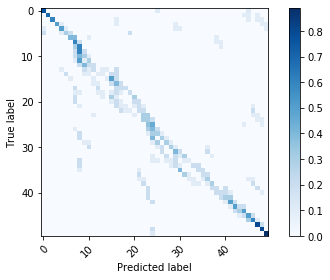

In [38]:
# from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

# import some data to play with
#iris = datasets.load_iris()
#X = iris.data
#y = iris.target
class_names = np.arange(0,bin_num+1)
#rint(class_names)

# Split the data into a training set and a test set
#X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# Run classifier, using a model that is too regularized (C too low) to see
# the impact on the results
#classifier = svm.SVC(kernel='linear', C=0.01)
#y_pred = classifier.fit(X_train, y_train).predict(X_test)





np.set_printoptions(precision=2)

test_group_pos=test_group_pos.astype('int32')
y_test_pre_inverse=y_test_pre_inverse.astype('int32')

# Plot non-normalized confusion matrix
#plot_confusion_matrix((test_group_pos[bins_before:-bins_after-1]), (y_test_pre_inverse), classes=class_names,
#                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix((test_group_pos[bins_before:-bins_after-1]), (y_test_pre_inverse), classes=class_names, normalize=True,
                      title='Normalized confusion matrix')
#plot_confusion_matrix((test_group_pos[6:305]), (y_test_pre_inverse[0:299]), classes=class_names, normalize=True,
#                      title='Normalized confusion matrix')


#plt.show()
plt.savefig("confusionmatrix_CA3_first5lap_average_example.svg")

Normalized confusion matrix


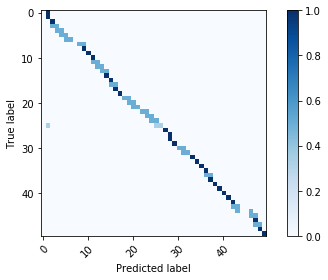

In [41]:
### from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

# import some data to play with
#iris = datasets.load_iris()
#X = iris.data
#y = iris.target
class_names = np.arange(0,bin_num+1)
#rint(class_names)

# Split the data into a training set and a test set
#X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# Run classifier, using a model that is too regularized (C too low) to see
# the impact on the results
#classifier = svm.SVC(kernel='linear', C=0.01)
#y_pred = classifier.fit(X_train, y_train).predict(X_test)





np.set_printoptions(precision=2)

valid_group_pos=valid_group_pos.astype('int32')
y_valid_pre_inverse=y_valid_pre_inverse.astype('int32')

# Plot non-normalized confusion matrix
#plot_confusion_matrix((test_group_pos[bins_before:-bins_after-1]), (y_test_pre_inverse), classes=class_names,
#                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
#plot_confusion_matrix((valid_group_pos[bins_before:-bins_after-1]), (y_valid_pre_inverse), classes=class_names, normalize=True,
#                      title='Normalized confusion matrix')
plot_confusion_matrix((valid_group_pos[6:105]), (y_valid_pre_inverse[0:99]), classes=class_names, normalize=True,
                      title='Normalized confusion matrix')


plt.show()

In [32]:
print(test_group_pos.shape)
print(y_test_pre_inverse.shape)

(512,)
(499, 1)


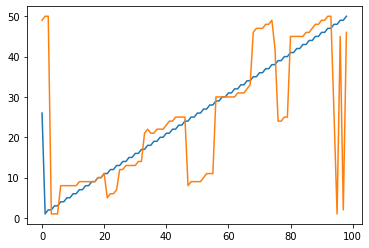

In [25]:
plt.figure()
plt.plot(test_group_pos[6:105])
plt.plot(y_test_pre_inverse[6:105])

In [34]:
 print('current_trail',lap_abs_d_test)

current_trail [13.5  12.29  2.24  2.29  2.11]


In [32]:
 print('last_trail',lap_abs_d_test)

last_trail [6.85 8.69 3.64 5.7  1.44]


In [29]:
epoch_data_result
score

array([[0.67],
       [0.81],
       [0.84],
       [0.87],
       [0.76],
       [0.66],
       [0.  ],
       [0.  ],
       [0.  ],
       [0.  ]])

In [10]:
np.save('ca3_1stlap_score_new_onePF_50bin_allanimal.npy', score) # save
np.save('ca3_1stlap_diff_new_onePF_50bin_allanimal.npy', diff)
np.save('ca3_1stlap_bylap_new_onePF_50bin_allanimal.npy', epoch_data_result)

In [26]:
epoch_data_result[0]['test_abs_diff'].shape[0]
score.shape
diff

array([[0.33]])

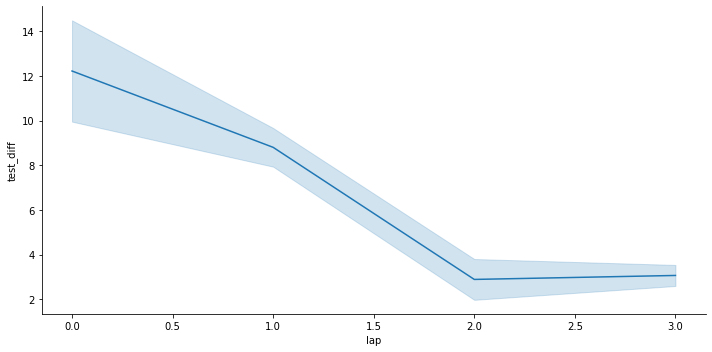

In [9]:

test_diff_list = []
for i in range(5):#(score.shape[0]):
    epoch_data_result[i]['lap'] = i+1
    entry = epoch_data_result[i]
    for j in range (4): #(len(entry['test_diff'])):
        test_diff_list.append({
            'lap':j,
            'test_diff':entry['test_abs_diff'][j],
            'test_score':entry['test_score'][j]
        })
                   
test_diff_list_cp=pd.DataFrame(test_diff_list) 


g = sns.relplot(x="lap", y="test_diff", kind="line",ci="sd", data=test_diff_list_cp, aspect=2)
#ax = sns.boxplot(x="id", y="test_score", data=test_diff_list_cp)

#median_width = 0.4
#group_median_val=[]

    
plt.show()

In [29]:
CA3_diff=np.load('ca3percantage_of_cells_diff.npy')
CA3_diff

array([[30.23733004,  6.15822002,  7.69221261,  1.64524104,  3.3868974 ],
       [27.07540173,  8.36341162,  4.74289246,  9.44499382,  2.9592089 ],
       [12.56118665,  8.84301607, 11.07416564,  2.35723115,  3.28430161],
       [ 9.47589617,  9.60692213,  8.12484549,  4.07169345,  2.98516687],
       [23.12360939, 11.84548826,  3.02595797,  4.68108776,  4.76514215]])

In [8]:
from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_confusion_matrix

# import some data to play with
iris = datasets.load_iris()
X = iris.data
y = iris.target
class_names = iris.target_names

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# Run classifier, using a model that is too regularized (C too low) to see
# the impact on the results
classifier = svm.SVC(kernel='linear', C=0.01).fit(X_train, y_train)

np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix, without normalization", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(classifier, X_test, y_test,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

ImportError: cannot import name 'plot_confusion_matrix' from 'sklearn.metrics' (C:\Users\Can\Anaconda3\lib\site-packages\sklearn\metrics\__init__.py)

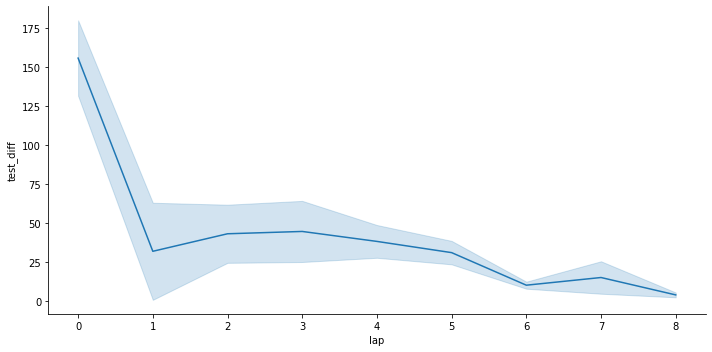

In [27]:

test_diff_list = []
for i in range(score.shape[0]):
    epoch_data_result[i]['lap'] = i+1
    entry = epoch_data_result[i]
    for j in range(len(entry['v_diff'])):
        test_diff_list.append({
            'lap':j,
            'test_diff':entry['test_diff'][j],
            'test_score':entry['test_score'][j]
        })
                   
test_diff_list_cp=pd.DataFrame(test_diff_list) 


g = sns.relplot(x="lap", y="test_diff", kind="line",ci="sd", data=test_diff_list_cp, aspect=2)
#ax = sns.boxplot(x="id", y="test_score", data=test_diff_list_cp)

median_width = 0.4
group_median_val=[]

    
plt.show()

In [30]:
PC_num_list=np.arange(20,41,20)
len(PC_num_list)

2

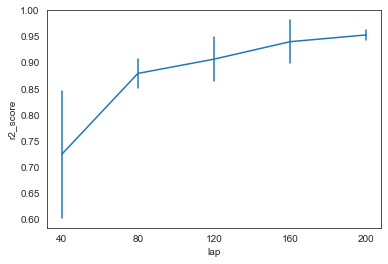

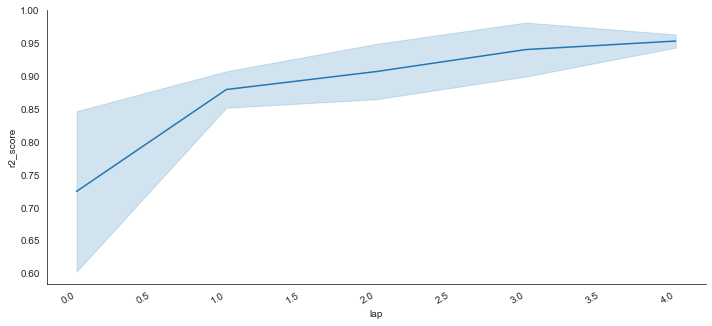

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

pd_dict = [{'lap': i, 'trial': j, 'r2_score': score[j,i], 'predict_error':diff[j,i]} for i in range(len(PC_num_list)) for j in range(trail_num)]
          
# pprint(pd_dict)
pd_result = pd.DataFrame(pd_dict)

x = sns.lineplot(x="lap", y="r2_score", 
                  err_style="bars", ci="sd", data=pd_result)
sns.set_style("white")
x.set_xticks(range(len(PC_num_list))) # <--- set the ticks first
x.set_xticklabels(['40','80','120','160','200'])
plt.savefig("percentage_of_neuron.svg")


g = sns.relplot(x="lap", y="r2_score", kind="line",ci="sd", data=pd_result, aspect=2)
sns.set_style("white")
g.fig.autofmt_xdate()

In [28]:
epoch_data_result

[{'v_score': array([ 0.98273252,  0.95326691,  0.92950432,  0.47452992,  0.43254935,
          0.92672177, -0.00499914,  0.95817784, -0.52556515]),
  'v_diff': array([  1.23863636,   3.35227273,   5.05681818,  37.69318182,
          40.70454545,   5.23863636,  72.09090909,   3.        ,
         108.37078652]),
  'test_score': array([-0.93067738, -0.49720159, -1.33000117,  0.07500158,  0.63754129,
          0.88609798,  0.31500374,  0.63896705,  0.96906532]),
  'test_diff': array([134.04545455, 107.39772727, 167.13636364,  66.35227273,
          26.        ,   8.17045455,  49.13636364,  25.89772727,
           2.26966292]),
  'train_score': array([1.        , 1.        , 1.        , 0.99984158, 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         0.99984158, 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 0.99984158, 1.        , 1.        ,
         0.99952475, 1.        , 1.        , 1.        , 1.        ,
        

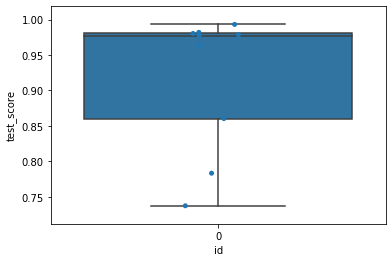

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

test_diff_list = []
for i in range(score.shape[1]):
    epoch_data_result[i]['id'] = i+1
    entry = epoch_data_result[i+1]
    for j in range(len(entry['v_diff'])):
        test_diff_list.append({
            'id':i,
            'test_diff':entry['v_diff'][j],
            'test_score':entry['v_score'][j]
        })
                   
test_diff_list_cp=pd.DataFrame(test_diff_list) 


ax = sns.stripplot(x="id", y="test_score", data=test_diff_list_cp)
ax = sns.boxplot(x="id", y="test_score", data=test_diff_list_cp)

median_width = 0.4
group_median_val=[]

for tick, text in zip(ax.get_xticks(), ax.get_xticklabels()):
    sample_name = int(text.get_text())  # "X" or "Y"

    # calculate the median value for all replicates of either X or Y
    #median_val = new_pd_result[(new_pd_result['lap']==0)&(new_pd_result['type']==sample_name)].predict_error.median()
    median_val = test_diff_list_cp[(test_diff_list_cp['id']==sample_name)].test_score.mean()
    group_median_val=np.append(group_median_val,median_val)
    # plot horizontal lines across the column, centered on the tick
    #ax.plot([tick-median_width/2, tick+median_width/2], [median_val, median_val],
    #        lw=4, color='k')
    
plt.show()

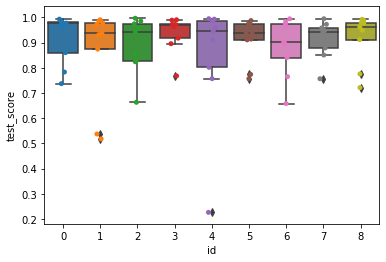

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

test_diff_list = []
for i in range(len(epoch_data_result)-1):
    epoch_data_result[i]['id'] = i+1
    entry = epoch_data_result[i+1]
    for j in range(len(entry['v_diff'])):
        test_diff_list.append({
            'id':i,
            'test_diff':entry['v_diff'][j],
            'test_score':entry['v_score'][j]
        })
                   
test_diff_list_cp=pd.DataFrame(test_diff_list) 


ax = sns.stripplot(x="id", y="test_score", data=test_diff_list_cp)
ax = sns.boxplot(x="id", y="test_score", data=test_diff_list_cp)

median_width = 0.4
group_median_val=[]

for tick, text in zip(ax.get_xticks(), ax.get_xticklabels()):
    sample_name = int(text.get_text())  # "X" or "Y"

    # calculate the median value for all replicates of either X or Y
    #median_val = new_pd_result[(new_pd_result['lap']==0)&(new_pd_result['type']==sample_name)].predict_error.median()
    median_val = test_diff_list_cp[(test_diff_list_cp['id']==sample_name)].test_score.mean()
    group_median_val=np.append(group_median_val,median_val)
    # plot horizontal lines across the column, centered on the tick
    #ax.plot([tick-median_width/2, tick+median_width/2], [median_val, median_val],
    #        lw=4, color='k')
    
plt.show()

In [20]:
#PC_id=np.append(exp['PC_id'],exp2['PC_id'])
#PC_num=int(np.ceil(np.sum(PC_id)*0.8))
#nonPC_num=int(np.ceil((X.shape[2]-PC_num)/2))


nonPC_num=600
#print(PC_num)

PC_X=X[:,:,PC_id==True]
PC_X_v=X_v[:,:,PC_id==True]
PC_X_t=X_t[:,:,PC_id==True]


nPC_X=X[:,:,PC_id==False]
nPC_X_v=X_v[:,:,PC_id==False]
nPC_X_t=X_t[:,:,PC_id==False]

X_random1,X_v_random1,X_t_random1=get_random_sample(PC_X,PC_X_v,PC_X_t,PC_num)
X_random2,X_v_random2,X_t_random2=get_random_sample(nPC_X,nPC_X_v,nPC_X_t,nonPC_num)

X_random=np.concatenate([X_random1,X_random2],axis=2)
X_v_random=np.concatenate([X_v_random1,X_v_random2],axis=2)
X_t_random=np.concatenate([X_t_random1,X_t_random2],axis=2)

#X=X_random
#X_v=X_v_random
#X_t=X_t_random

X_train_set = X_random[bins_before:-1-bins_after, :, :]
Y_train_set = Y[bins_before:-1-bins_after, :]
X_valid_set = X_v_random[bins_before:-1-bins_after, :, :]
Y_valid_set = Y_valid[bins_before:-1-bins_after, :]
X_test_set = X_t_random[bins_before:-1-bins_after, :, :]
print(X_train_set.shape,
      Y_train_set.shape,
     X_valid_set.shape,
     Y_valid_set.shape,
     X_test_set.shape)

150
214
704
(3509, 13, 750) (3509, 30) (809, 13, 750) (809, 30) (809, 13, 750)


start 36
poses 0.008352837135791779 0.6432668232218424
start 40
poses 0.007416850497722626 0.6431752704874674
start 32
poses 0.0075084144079685215 0.6431447330411275
start 36
poses 0.007284591516256333 0.6427479449208577
start 51
poses 0.003286300768852234 0.6404385132884979


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

Train on 4050 samples, validate on 359 samples
Epoch 1/100
4050/4050 [==============================] - 33s 8ms/sample - loss: 0.0583 - accuracy: 0.1402
Epoch 2/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 0.0258 - accuracy: 0.4005
Epoch 3/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 0.0206 - accuracy: 0.5800
Epoch 4/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 0.0165 - accuracy: 0.7005
Epoch 5/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 0.0137 - accuracy: 0.7437
Epoch 6/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 0.0115 - accuracy: 0.7941
Epoch 7/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 0.0099 - accuracy: 0.8217
Epoch 8/100
4050/4050 [==============================] - 30s 8ms/sample - loss: 0.0088 - accuracy: 0.8489
Epoch 9/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 0.0082 - accuracy: 0.8560

4050/4050 [==============================] - 30s 7ms/sample - loss: 3.4905e-04 - accuracy: 0.9960
Epoch 74/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 2.4572e-04 - accuracy: 0.9985
Epoch 75/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 3.1497e-04 - accuracy: 0.9968
Epoch 76/100
4050/4050 [==============================] - 30s 8ms/sample - loss: 1.8766e-04 - accuracy: 0.9990
Epoch 77/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 2.1943e-04 - accuracy: 0.9985
Epoch 78/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 2.1109e-04 - accuracy: 0.9980
Epoch 79/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 2.5367e-04 - accuracy: 0.9975
Epoch 80/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 2.5155e-04 - accuracy: 0.9973 - val_loss: 0.0242 - val_accuracy: 0.5655
Epoch 81/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 3.

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[  5  95 185 275 365 455 545 635 725 815 912]
[  5  95 185 275 365 455 545 635 725 815 912]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[   5   96  186  276  366  456  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]
[   5   96  186  276  366  456  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

start 36
poses 0.00814936177968979 0.6433889134025573
start 40
poses 0.008271446993350983 0.6427276197369893
start 32
poses 0.007579630782604218 0.6432362957096099
start 36
poses 0.007477893104553223 0.6426563921864827
start 51
poses 0.002986174618601799 0.6400417251682281


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

Train on 4050 samples, validate on 359 samples
Epoch 1/100
4050/4050 [==============================] - 32s 8ms/sample - loss: 0.0547 - accuracy: 0.1454
Epoch 2/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0257 - accuracy: 0.4104
Epoch 3/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0205 - accuracy: 0.5886
Epoch 4/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0166 - accuracy: 0.6938
Epoch 5/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0136 - accuracy: 0.7528
Epoch 6/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0114 - accuracy: 0.7901
Epoch 7/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0095 - accuracy: 0.8296
Epoch 8/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0087 - accuracy: 0.8479
Epoch 9/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0078 - accuracy: 0.8642

4050/4050 [==============================] - 30s 7ms/sample - loss: 2.9806e-04 - accuracy: 0.9973
Epoch 74/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 4.2152e-04 - accuracy: 0.9943
Epoch 75/100
4050/4050 [==============================] - 30s 8ms/sample - loss: 3.0227e-04 - accuracy: 0.9978
Epoch 76/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 3.4837e-04 - accuracy: 0.9953
Epoch 77/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 3.5725e-04 - accuracy: 0.9960
Epoch 78/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 2.3700e-04 - accuracy: 0.9983
Epoch 79/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 2.3783e-04 - accuracy: 0.9983
Epoch 80/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 3.7190e-04 - accuracy: 0.9963 - val_loss: 0.0019 - val_accuracy: 0.9638
Epoch 81/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 2.

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[  5  95 185 275 365 455 545 635 725 815 912]
[  5  95 185 275 365 455 545 635 725 815 912]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[   5   95  186  276  366  456  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]
[   5   95  186  276  366  456  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

start 36
poses 0.0079458864235878 0.6432464781697591
start 40
poses 0.007915365120172501 0.6431650880273183
start 32
poses 0.006959030946493149 0.643012450466156
start 36
poses 0.0068132069412867235 0.6432057681973775
start 51
poses 0.0031947368586063385 0.6395534141159057


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

Train on 4050 samples, validate on 359 samples
Epoch 1/100
4050/4050 [==============================] - 32s 8ms/sample - loss: 0.0529 - accuracy: 0.1437
Epoch 2/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 0.0259 - accuracy: 0.3899
Epoch 3/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0208 - accuracy: 0.5909
Epoch 4/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 0.0170 - accuracy: 0.6812
Epoch 5/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0141 - accuracy: 0.7437
Epoch 6/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0120 - accuracy: 0.7810
Epoch 7/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0102 - accuracy: 0.8126
Epoch 8/100
4050/4050 [==============================] - 30s 8ms/sample - loss: 0.0088 - accuracy: 0.8427
Epoch 9/100
4050/4050 [==============================] - 30s 8ms/sample - loss: 0.0081 - accuracy: 0.8543

4050/4050 [==============================] - 30s 7ms/sample - loss: 4.7099e-04 - accuracy: 0.9943
Epoch 74/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 4.8832e-04 - accuracy: 0.9943
Epoch 75/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 4.2628e-04 - accuracy: 0.9951
Epoch 76/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 3.9540e-04 - accuracy: 0.9956
Epoch 77/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 3.2478e-04 - accuracy: 0.9970
Epoch 78/100
4050/4050 [==============================] - 30s 8ms/sample - loss: 3.6909e-04 - accuracy: 0.9953
Epoch 79/100
4050/4050 [==============================] - 30s 8ms/sample - loss: 3.1330e-04 - accuracy: 0.9968
Epoch 80/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 2.3356e-04 - accuracy: 0.9985 - val_loss: 5.8141e-04 - val_accuracy: 0.9889
Epoch 81/100
4050/4050 [==============================] - 30s 7ms/sample - loss

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[  5  95 185 275 365 455 545 635 725 815 912]
[  5  95 185 275 365 455 545 635 725 815 912]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[   5   95  185  276  366  456  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]
[   5   95  185  276  366  456  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

start 36
poses 0.008159535547494889 0.6432057681973775
start 40
poses 0.007701715996265412 0.6430836780166626
start 32
poses 0.00773223729968071 0.6427174174086252
start 36
poses 0.007518588175773621 0.6432973407999674
start 51
poses 0.0028996975922584533 0.6399959488010406


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

Train on 4050 samples, validate on 359 samples
Epoch 1/100
4050/4050 [==============================] - 32s 8ms/sample - loss: 0.0544 - accuracy: 0.1430
Epoch 2/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0259 - accuracy: 0.3931
Epoch 3/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0206 - accuracy: 0.5822
Epoch 4/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0168 - accuracy: 0.6872
Epoch 5/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0142 - accuracy: 0.7301
Epoch 6/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0117 - accuracy: 0.7800
Epoch 7/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0101 - accuracy: 0.8119
Epoch 8/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0092 - accuracy: 0.8299
Epoch 9/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0077 - accuracy: 0.8617

4050/4050 [==============================] - 29s 7ms/sample - loss: 3.4084e-04 - accuracy: 0.9960
Epoch 74/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 3.2550e-04 - accuracy: 0.9960
Epoch 75/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 2.9174e-04 - accuracy: 0.9970
Epoch 76/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 2.3440e-04 - accuracy: 0.9983
Epoch 77/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 3.3977e-04 - accuracy: 0.9965
Epoch 78/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 1.9522e-04 - accuracy: 0.9990
Epoch 79/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 2.9900e-04 - accuracy: 0.9970
Epoch 80/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 3.0482e-04 - accuracy: 0.9970 - val_loss: 5.5847e-04 - val_accuracy: 0.9944
Epoch 81/100
4050/4050 [==============================] - 29s 7ms/sample - loss

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[  5  95 185 275 365 455 545 635 725 815 912]
[  5  95 185 275 365 455 545 635 725 815 912]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[   5   95  185  275  366  456  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]
[   5   95  185  275  366  456  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

start 36
poses 0.007040421088933945 0.6430633329645792


C:\Users\Can\Documents\GitHub\HP_Decoding\decoder_utils.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


start 40
poses 0.007579630782604218 0.6427174472109476
start 32
poses 0.007915365120172501 0.6430328153864542
start 36
poses 0.008067971637248993 0.6429921252822876
start 51
poses 0.003347343375682831 0.6392787261104583


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

Train on 4050 samples, validate on 359 samples
Epoch 1/100
4050/4050 [==============================] - 32s 8ms/sample - loss: 0.0568 - accuracy: 0.1356
Epoch 2/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0258 - accuracy: 0.3973
Epoch 3/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0207 - accuracy: 0.5894
Epoch 4/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0169 - accuracy: 0.6911
Epoch 5/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0140 - accuracy: 0.7449
Epoch 6/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0117 - accuracy: 0.7857
Epoch 7/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0101 - accuracy: 0.8173
Epoch 8/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0091 - accuracy: 0.8351
Epoch 9/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0082 - accuracy: 0.8546

4050/4050 [==============================] - 29s 7ms/sample - loss: 3.8976e-04 - accuracy: 0.9960
Epoch 74/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 2.5369e-04 - accuracy: 0.9980
Epoch 75/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 2.4210e-04 - accuracy: 0.9983
Epoch 76/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 3.1071e-04 - accuracy: 0.9968
Epoch 77/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 4.1782e-04 - accuracy: 0.9951
Epoch 78/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 2.0875e-04 - accuracy: 0.9983
Epoch 79/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 3.4143e-04 - accuracy: 0.9960
Epoch 80/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 1.9917e-04 - accuracy: 0.9985 - val_loss: 0.0019 - val_accuracy: 0.9694
Epoch 81/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 3.

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[  5  95 185 275 365 455 545 635 725 815 912]
[  5  95 185 275 365 455 545 635 725 815 912]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[   5   95  185  275  365  456  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]
[   5   95  185  275  365  456  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

start 36
poses 0.008037450333833695 0.6432261132494608


C:\Users\Can\Documents\GitHub\HP_Decoding\decoder_utils.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


start 40
poses 0.007833974977731705 0.6429616077041626
start 32
poses 0.007396502962112427 0.6430735054906209
start 36
poses 0.007725454787810644 0.6426564021205902
start 51
poses 0.0029658270829916 0.6406979425048828


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

Train on 4050 samples, validate on 359 samples
Epoch 1/100
4050/4050 [==============================] - 31s 8ms/sample - loss: 0.0580 - accuracy: 0.1301
Epoch 2/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0261 - accuracy: 0.3780
Epoch 3/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0210 - accuracy: 0.5736
Epoch 4/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0173 - accuracy: 0.6674
Epoch 5/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0142 - accuracy: 0.7336
Epoch 6/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0122 - accuracy: 0.7701
Epoch 7/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0106 - accuracy: 0.8012
Epoch 8/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0095 - accuracy: 0.8227
Epoch 9/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0087 - accuracy: 0.8390

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[  5  95 185 275 365 455 545 635 725 815 912]
[  5  95 185 275 365 455 545 635 725 815 912]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[   5   95  185  275  365  455  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]
[   5   95  185  275  365  455  546  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

start 36
poses 0.008105275452534358 0.6434397859668731


C:\Users\Can\Documents\GitHub\HP_Decoding\decoder_utils.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


start 40
poses 0.006704686751365662 0.6433380309041341
start 32
poses 0.007447371801137925 0.6430328153864542
start 36
poses 0.008281620761156083 0.6425444944000244
start 51
poses 0.0027979599142074585 0.6401994291241963


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

Train on 4050 samples, validate on 359 samples
Epoch 1/100
4050/4050 [==============================] - 32s 8ms/sample - loss: 0.0555 - accuracy: 0.1126
Epoch 2/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0261 - accuracy: 0.3817
Epoch 3/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0210 - accuracy: 0.5657
Epoch 4/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0172 - accuracy: 0.6840
Epoch 5/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0146 - accuracy: 0.7259
Epoch 6/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0125 - accuracy: 0.7662
Epoch 7/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0109 - accuracy: 0.7906
Epoch 8/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0099 - accuracy: 0.8116
Epoch 9/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0089 - accuracy: 0.8390

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[  5  95 185 275 365 455 545 635 725 815 912]
[  5  95 185 275 365 455 545 635 725 815 912]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[   5   95  185  275  365  455  545  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]
[   5   95  185  275  365  455  545  636  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

start 36
poses 0.007264243980646134 0.642992135216395


C:\Users\Can\Documents\GitHub\HP_Decoding\decoder_utils.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


start 40
poses 0.007406676729917527 0.6430633329645792
start 32
poses 0.007640673389434815 0.6426258547401428
start 36
poses 0.007040421088933945 0.6429310901260376
start 51
poses 0.004232461174726487 0.6397365195846557


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

Train on 4050 samples, validate on 359 samples
Epoch 1/100
4050/4050 [==============================] - 32s 8ms/sample - loss: 0.0560 - accuracy: 0.1217
Epoch 2/100
4050/4050 [==============================] - 29s 7ms/sample - loss: 0.0262 - accuracy: 0.3765
Epoch 3/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0211 - accuracy: 0.5736
Epoch 4/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0173 - accuracy: 0.6763
Epoch 5/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0147 - accuracy: 0.7346
Epoch 6/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0123 - accuracy: 0.7756
Epoch 7/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0107 - accuracy: 0.7995
Epoch 8/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0095 - accuracy: 0.8267
Epoch 9/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0085 - accuracy: 0.8496

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[  5  95 185 275 365 455 545 635 725 815 912]
[  5  95 185 275 365 455 545 635 725 815 912]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[   5   95  185  275  365  455  545  635  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]
[   5   95  185  275  365  455  545  635  726  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

start 36
poses 0.007427024265527726 0.6428089999453226


C:\Users\Can\Documents\GitHub\HP_Decoding\decoder_utils.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


start 40
poses 0.007701715996265412 0.6430124703343709
start 32
poses 0.008210404386520386 0.6429615977700551
start 36
poses 0.008291794528961182 0.6429310702578226
start 51
poses 0.003026869689822197 0.6409421129322052


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

Train on 4050 samples, validate on 359 samples
Epoch 1/100
4050/4050 [==============================] - 32s 8ms/sample - loss: 0.0577 - accuracy: 0.1279
Epoch 2/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0262 - accuracy: 0.3780
Epoch 3/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0212 - accuracy: 0.5723
Epoch 4/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0174 - accuracy: 0.6699
Epoch 5/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0143 - accuracy: 0.7356
Epoch 6/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0121 - accuracy: 0.7677
Epoch 7/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0104 - accuracy: 0.8052
Epoch 8/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0093 - accuracy: 0.8247
Epoch 9/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0082 - accuracy: 0.8467

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[  5  95 185 275 365 455 545 635 725 815 912]
[  5  95 185 275 365 455 545 635 725 815 912]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[   5   95  185  275  365  455  545  635  725  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]
[   5   95  185  275  365  455  545  635  725  816  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

start 36
poses 0.007233722677230835 0.6429107351398468
start 40


C:\Users\Can\Documents\GitHub\HP_Decoding\decoder_utils.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,10))


poses 0.007406676729917527 0.6430429879124959
start 32
poses 0.007498240640163422 0.6430430077807108
start 36
poses 0.00813918801188469 0.6430633329645792
start 51
poses 0.003942508792281151 0.6396449370479583


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

Train on 4050 samples, validate on 359 samples
Epoch 1/100
4050/4050 [==============================] - 32s 8ms/sample - loss: 0.0544 - accuracy: 0.1173
Epoch 2/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0263 - accuracy: 0.3686
Epoch 3/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0212 - accuracy: 0.5556
Epoch 4/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0176 - accuracy: 0.6664
Epoch 5/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0146 - accuracy: 0.7301
Epoch 6/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0125 - accuracy: 0.7649
Epoch 7/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0108 - accuracy: 0.8020
Epoch 8/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0096 - accuracy: 0.8188
Epoch 9/100
4050/4050 [==============================] - 30s 7ms/sample - loss: 0.0086 - accuracy: 0.8432

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[  5  95 185 275 365 455 545 635 725 815 912]
[  5  95 185 275 365 455 545 635 725 815 912]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

[   5   95  185  275  365  455  545  635  725  815  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]
[   5   95  185  275  365  455  545  635  725  815  906  996 1086 1176
 1266 1356 1446 1536 1626 1716 1806 1896 1986 2076 2166 2256 2346 2436
 2526 2616 2706 2796 2886 2976 3066 3156 3246 3336 3426 3516 3606 3696
 3786 3876 3966 4063]


C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
C:\Users\Can\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a

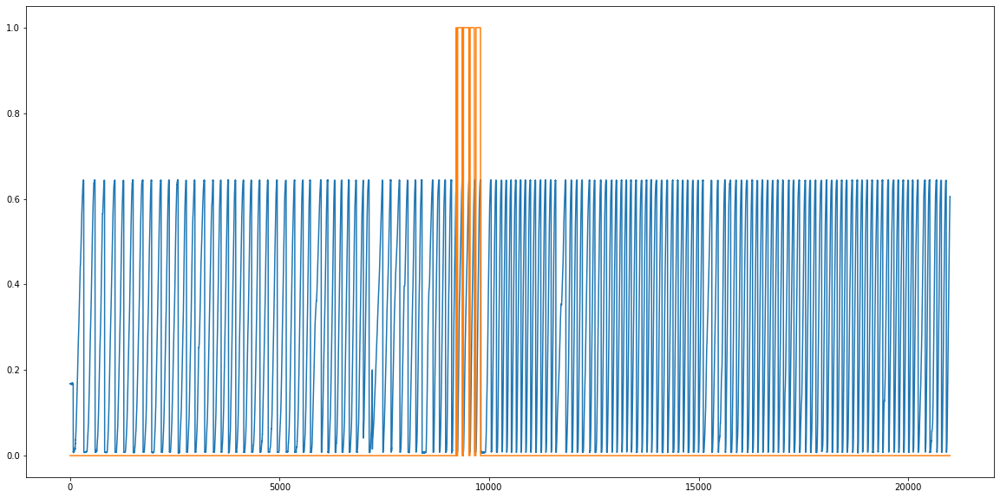

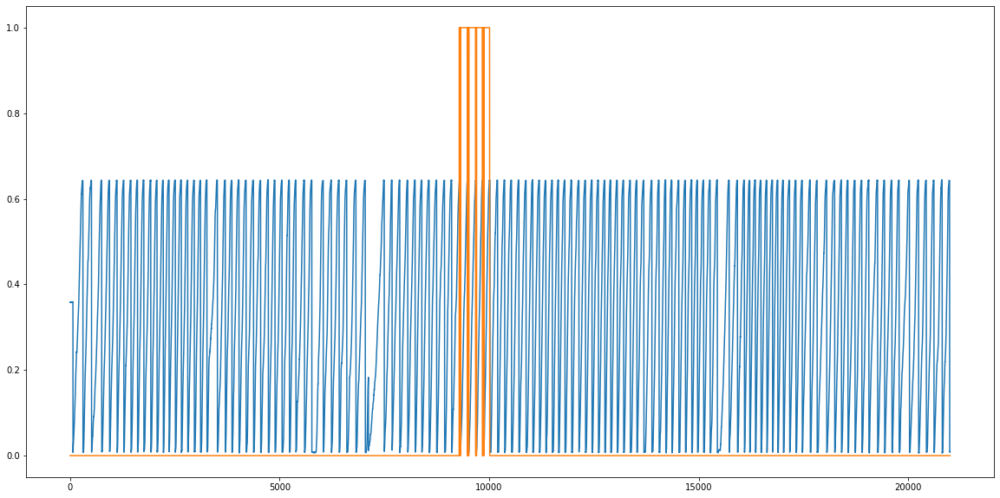

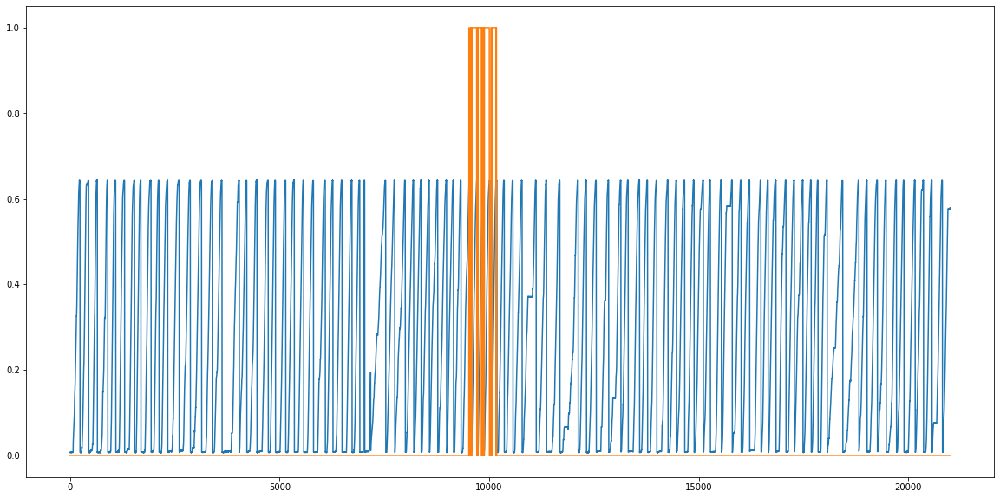

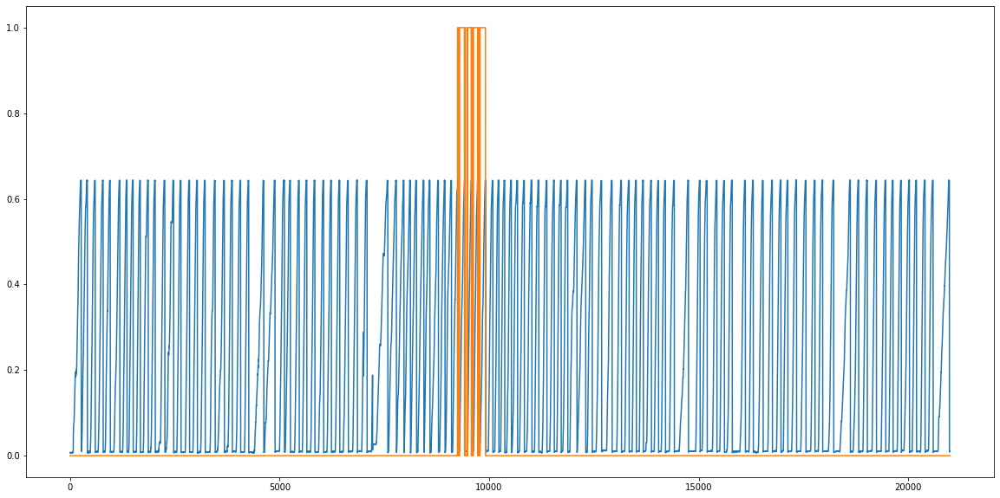

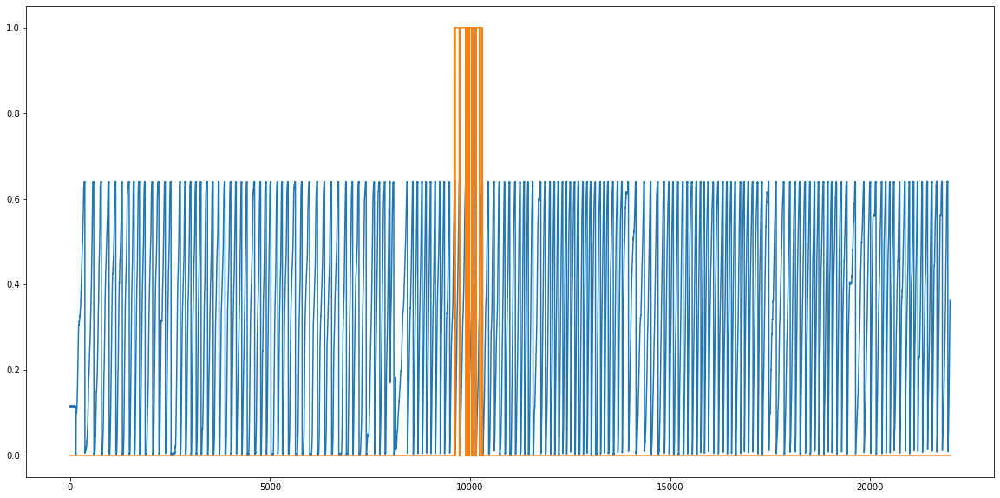

...

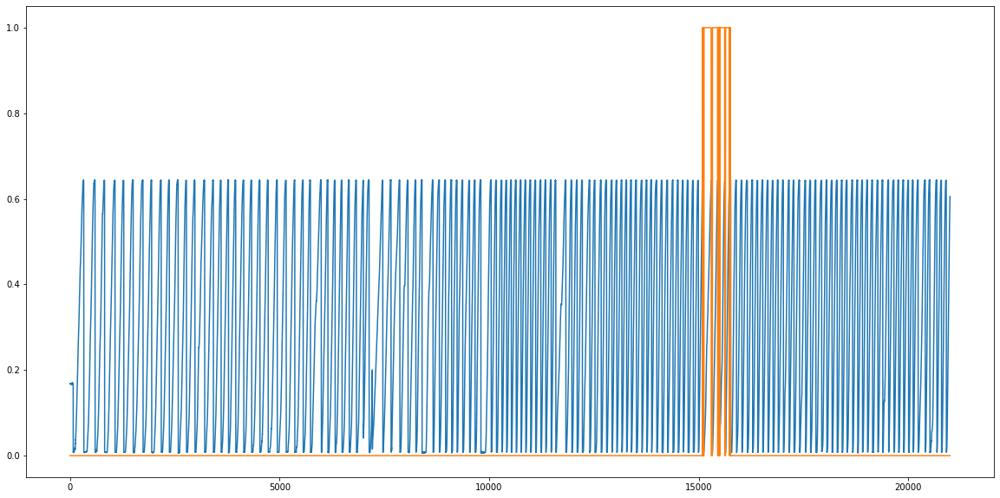

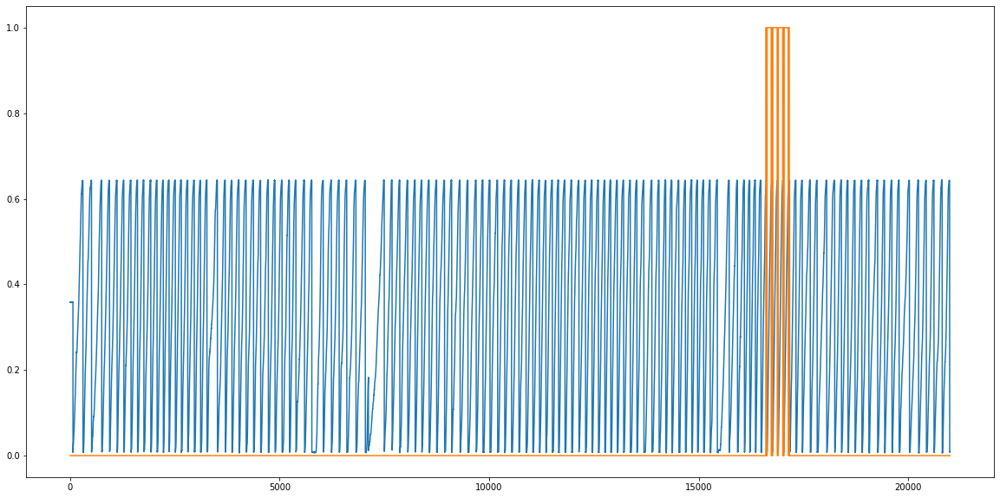

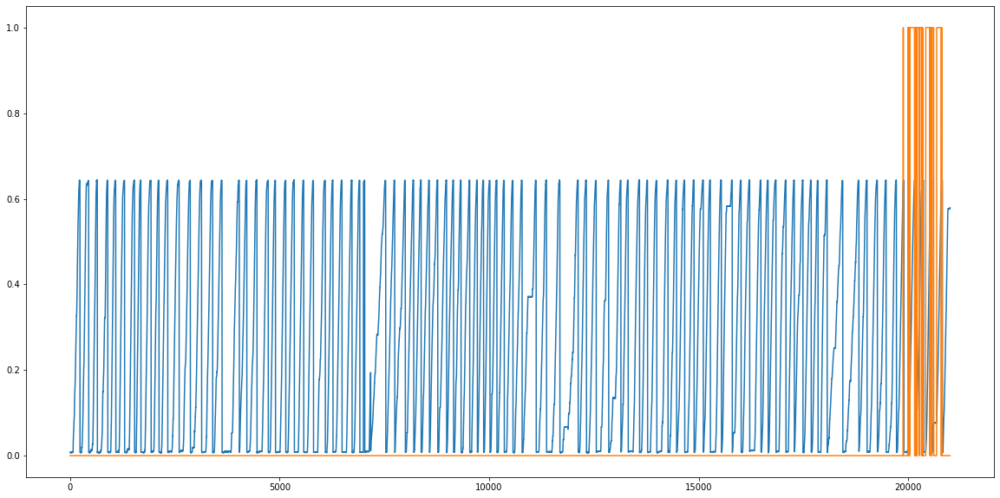

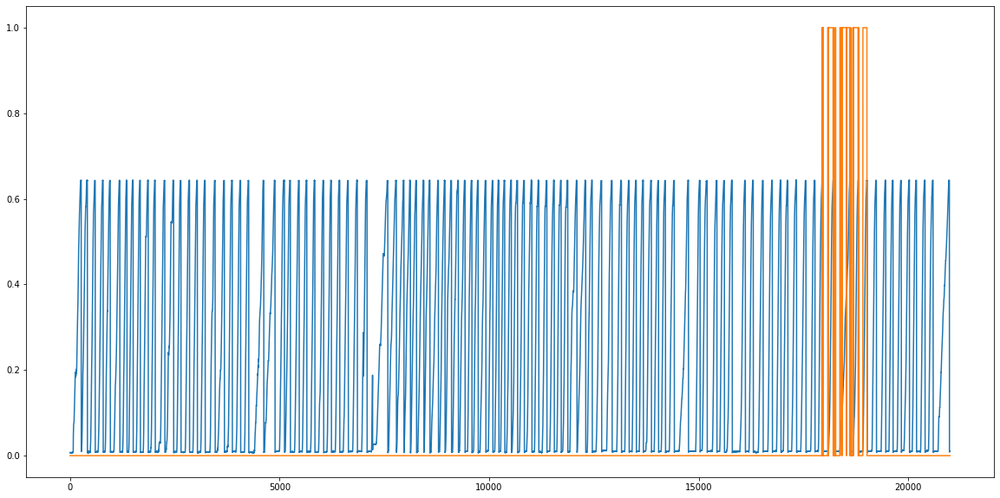

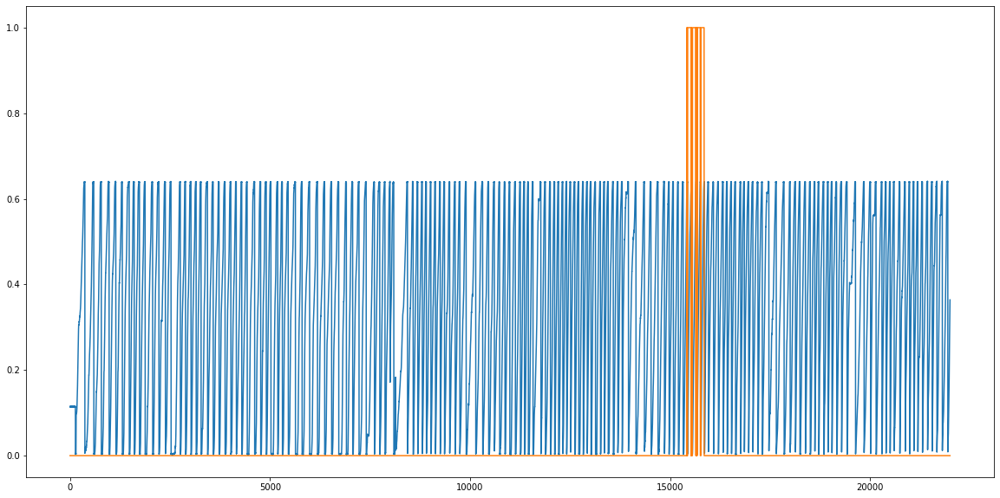

In [5]:

validation_unit=int(validation_lap_num/trail_num)
score=np.zeros([trail_num,1])
diff=np.zeros([trail_num,1])
epoch_data_result=[]
for trail in range(trail_num):
    
    train_group_X, train_group_pos,valid_group_X,valid_group_pos=produce_cross_validationset(G_CA3,validation_unit,train_X,train_group_pos_all,test_lap_num,session_type,
                                bins_before,bins_after,bins_current,group_bin,bin_num,trail)

# orgnize data for LSTM
    X=get_spikes_with_history(train_group_X,bins_before,bins_after,bins_current)
    X_v=get_spikes_with_history(valid_group_X,bins_before,bins_after,bins_current)
    X_t=get_spikes_with_history(test_group_X,bins_before,bins_after,bins_current)

    le = LabelEncoder()
    y_lst=[[i] for i in train_group_pos]
    y_valid_lst=[[i] for i in valid_group_pos]
    y_test_lst=[[i] for i in test_group_pos]

    ohe = OneHotEncoder()
    Y = ohe.fit_transform(y_lst).toarray()
    Y_valid=ohe.fit_transform(y_valid_lst).toarray()
    Y_test=ohe.fit_transform(y_test_lst).toarray()


    #LSTM_model=fit_LSTM(X[6:-7,:,:],Y[6:-7,:],X_v, Y_valid,1)
    root_dir = r'..\Neural_Decoding\training_models'
    model_path = os.path.join(root_dir, 'ca3_allneuron_validation'+str(trail))
    os.makedirs(root_dir, exist_ok=True)

    X_train_set = X[bins_before:-1-bins_after, :, :]
    Y_train_set = Y[bins_before:-1-bins_after, :]
    X_valid_set = X_v[bins_before:-1-bins_after, :, :]
    Y_valid_set = Y_valid[bins_before:-1-bins_after, :]
    X_test_set = X_t[bins_before:-1-bins_after, :, :]
    #print(X_train_set.shape,
    #      Y_train_set.shape,
    #     X_valid_set.shape,
    #     Y_valid_set.shape,
    #     X_test_set.shape)

    LSTM_model=fit_LSTM(X_train_set, Y_train_set, X_valid_set, Y_valid_set,100, model_path, 
                              force=True)
    lap_s_v,lap_d_t=compute_lap_score(X_v, valid_group_pos,LSTM_model,bins_before,bins_after)
    lap_s_test,lap_d_test=compute_lap_score(X_t, test_group_pos,LSTM_model,bins_before,bins_after)
    lap_s_train,lap_d_train=compute_lap_score(X, train_group_pos,LSTM_model,bins_before,bins_after)
    y_valid_predicted=LSTM_model.predict(X_valid_set)
    y_test_predicted=LSTM_model.predict(X_test_set)
    y_train_predicted=LSTM_model.predict(X_train_set)

    #Y = ohe.fit_transform(y_lst).toarray()
    #Y_valid=ohe.fit_transform(y_valid_lst).toarray()
    #Y_test=ohe.fit_transform(y_test_lst).toarray()

    y_valid_pre_inverse=ohe.inverse_transform(y_valid_predicted)
    y_test_pre_inverse=ohe.inverse_transform(y_test_predicted)

    score[trail] = sklearn.metrics.r2_score(valid_group_pos[bins_before:-bins_after-1], y_valid_pre_inverse)
    diff[trail] = sklearn.metrics.mean_squared_error(valid_group_pos[bins_before:-bins_after-1], y_valid_pre_inverse)

    epoch_data_result.append(dict(v_score=lap_s_v, v_diff=lap_d_t,
                test_score=lap_s_test, test_diff=lap_d_test,
                train_score=lap_s_train, train_diff=lap_d_train))

In [22]:
LSTM_model=fit_LSTM(X_train_set, Y_train_set, X_valid_set, Y_valid_set,100, model_path, 
                          force=True)

Train on 3599 samples, validate on 899 samples
Epoch 1/100
3599/3599 [==============================] - 21s 6ms/sample - loss: 0.0269 - accuracy: 0.4109
Epoch 2/100
3599/3599 [==============================] - 26s 7ms/sample - loss: 0.0168 - accuracy: 0.7002
Epoch 3/100
3599/3599 [==============================] - 33s 9ms/sample - loss: 0.0125 - accuracy: 0.8069
Epoch 4/100
3599/3599 [==============================] - 35s 10ms/sample - loss: 0.0097 - accuracy: 0.8400
Epoch 5/100
3599/3599 [==============================] - 41s 11ms/sample - loss: 0.0083 - accuracy: 0.8577
Epoch 6/100
3599/3599 [==============================] - 35s 10ms/sample - loss: 0.0072 - accuracy: 0.8789
Epoch 7/100
3599/3599 [==============================] - 35s 10ms/sample - loss: 0.0064 - accuracy: 0.8972
Epoch 8/100
3599/3599 [==============================] - 35s 10ms/sample - loss: 0.0060 - accuracy: 0.9028
Epoch 9/100
3599/3599 [==============================] - 35s 10ms/sample - loss: 0.0054 - accuracy: 

In [23]:
LSTM_model=tf.keras.models.load_model(model_path)
# y_valid_predicted=LSTM_model.predict(X_v[6:-7,:,:])
# y_test_predicted=LSTM_model.predict(X_t[6:-7,:,:])
# y_train_predicted=LSTM_model.predict(X[6:-7,:,:])
y_valid_predicted=LSTM_model.predict(X_valid_set)
y_test_predicted=LSTM_model.predict(X_test_set)
y_train_predicted=LSTM_model.predict(X_train_set)

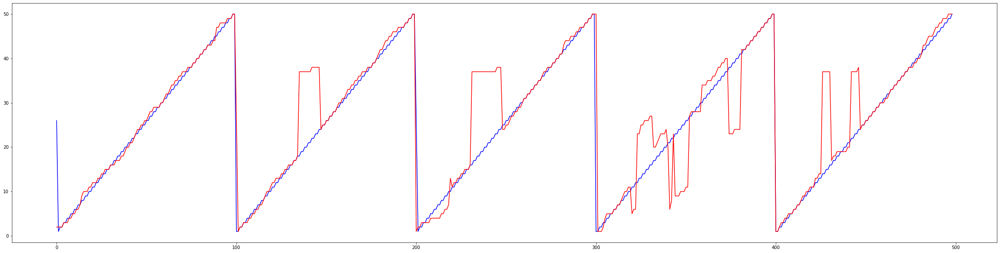

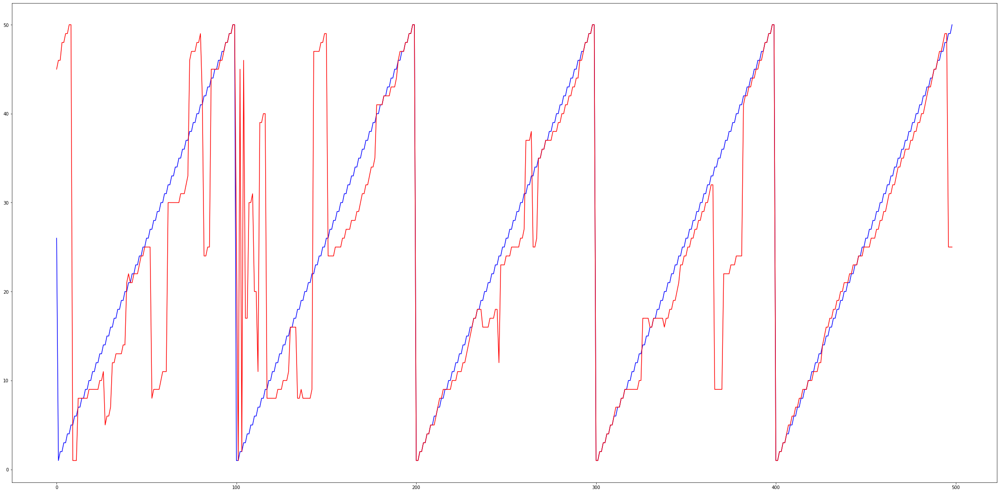

In [12]:
y_valid_pre_inverse=ohe.inverse_transform(y_valid_predicted)
#print(y_valid_predict_inverse)
plt.figure(figsize=(40,10))
plt.plot(valid_group_pos[6:-7],'b')
plt.plot(y_valid_pre_inverse[:],'r')
plt.savefig("CA3_validation_traces.svg")

#print(y_valid.shape, y_valid_pre_inverse.shape, X_valid_set.shape, y_valid_predicted.shape)
y_test_pre_inverse=ohe.inverse_transform(y_test_predicted)
#print(y_valid_predict_inverse)
plt.figure(figsize=(40,20))
plt.plot(test_group_pos[6:-7],'b')
plt.plot(y_test_pre_inverse[:],'r')
plt.savefig("CA3_testing_traces.svg")

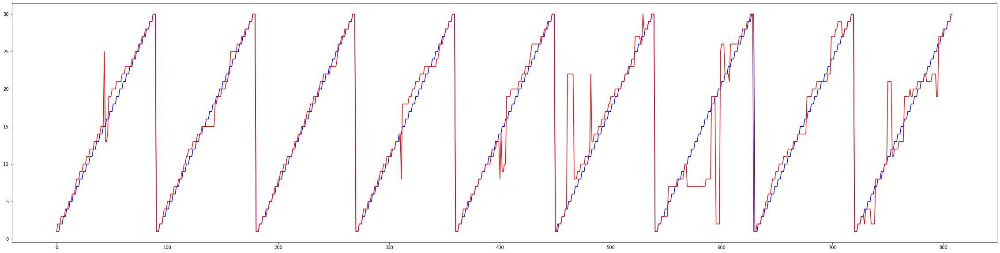

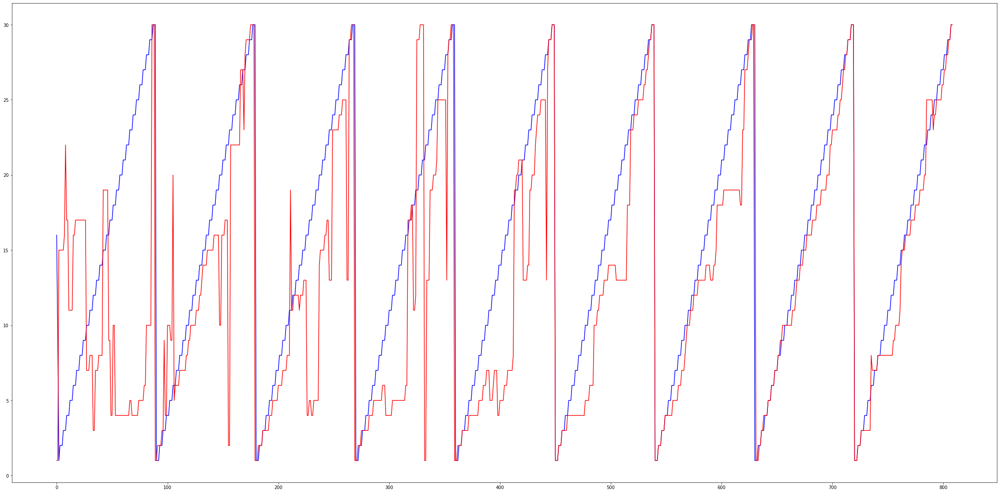

In [18]:
y_valid_pre_inverse=ohe.inverse_transform(y_valid_predicted)
#print(y_valid_predict_inverse)
plt.figure(figsize=(40,10))
plt.plot(valid_group_pos[6:-7],'b')
plt.plot(y_valid_pre_inverse[:],'r')

#print(y_valid.shape, y_valid_pre_inverse.shape, X_valid_set.shape, y_valid_predicted.shape)
y_test_pre_inverse=ohe.inverse_transform(y_test_predicted)
#print(y_valid_predict_inverse)
plt.figure(figsize=(40,20))
plt.plot(test_group_pos[6:-7],'b')
plt.plot(y_test_pre_inverse[:],'r')

c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used

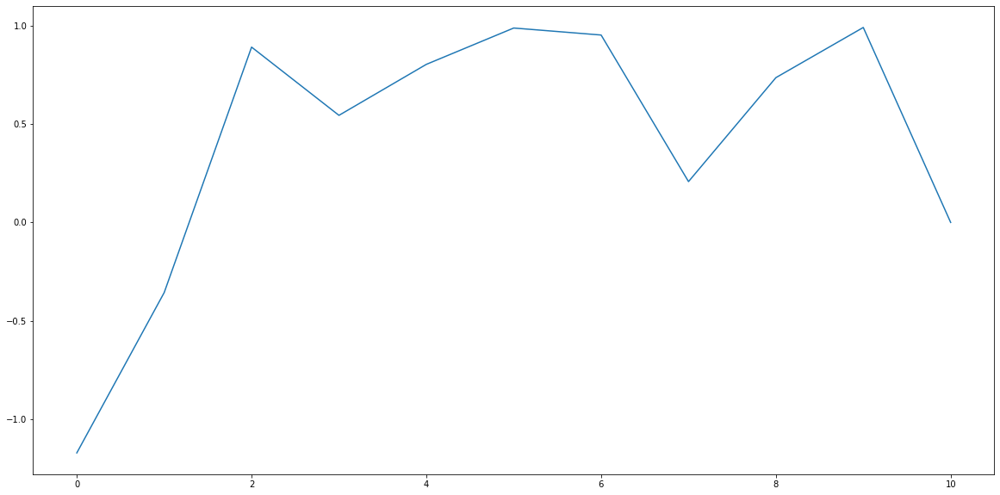

In [25]:
lap_s,lap_d=compute_lap_score(X_t, test_group_pos,LSTM_model,bins_before,bins_after)
plt.figure(figsize=(20,10))
plt.plot(lap_s)#[0:15])

(-1, 1)

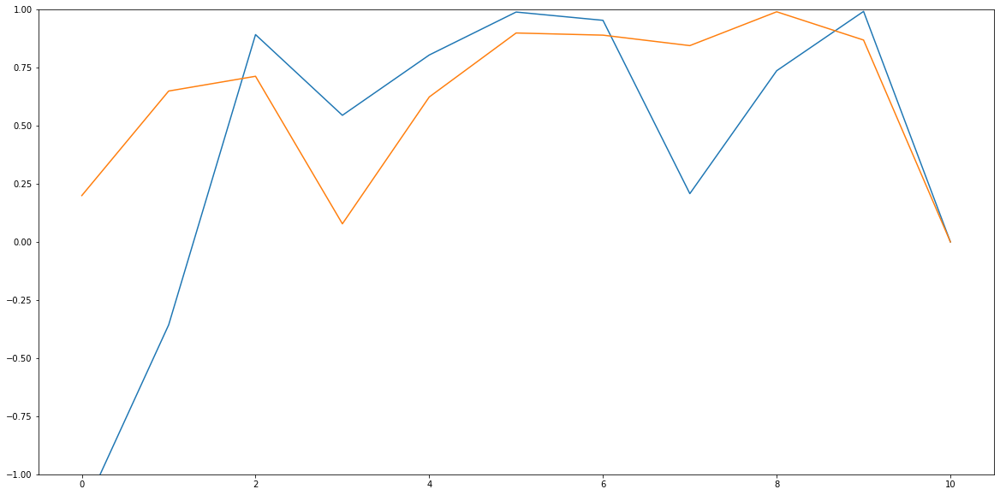

In [26]:
CA1_score= np.load('ca1_score1_day1.npy')
CA1_diff=np.load('ca1_diff1_day1.npy')
plt.figure(figsize=(20,10))
plt.plot(lap_s)#[0:15])
plt.plot(CA1_score)
plt.ylim(-1,1)

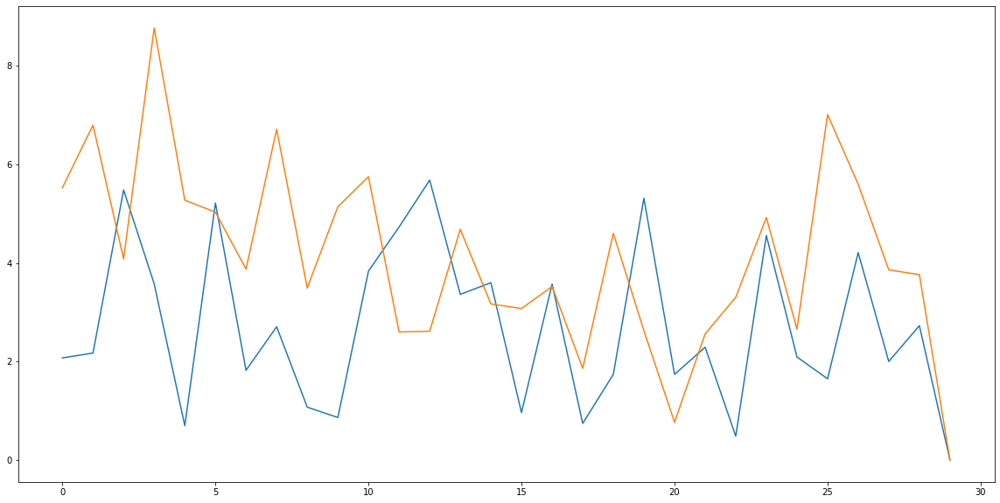

In [115]:
plt.figure(figsize=(20,10))
plt.plot(np.sqrt(lap_d))#[0:15])
plt.plot(np.sqrt(CA1_diff))
#plt.ylim(-1,1)

205
720
Train on 3599 samples, validate on 899 samples
Epoch 1/100
3599/3599 [==============================] - 45s 12ms/sample - loss: 0.0264 - accuracy: 0.4115
Epoch 2/100
3599/3599 [==============================] - 39s 11ms/sample - loss: 0.0171 - accuracy: 0.6977
Epoch 3/100
3599/3599 [==============================] - 34s 9ms/sample - loss: 0.0124 - accuracy: 0.8052
Epoch 4/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 0.0095 - accuracy: 0.8397
Epoch 5/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0083 - accuracy: 0.8563
Epoch 6/100
3599/3599 [==============================] - 38s 11ms/sample - loss: 0.0072 - accuracy: 0.8777
Epoch 7/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 0.0064 - accuracy: 0.8900
Epoch 8/100
3599/3599 [==============================] - 39s 11ms/sample - loss: 0.0059 - accuracy: 0.9044
Epoch 9/100
3599/3599 [==============================] - 39s 11ms/sample - loss: 0.0053 - 

3599/3599 [==============================] - 37s 10ms/sample - loss: 1.5732e-04 - accuracy: 0.9978
Epoch 73/100
3599/3599 [==============================] - 36s 10ms/sample - loss: 6.1792e-05 - accuracy: 0.9997
Epoch 74/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 8.7770e-05 - accuracy: 0.9992
Epoch 75/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.5548e-04 - accuracy: 0.9981
Epoch 76/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 9.6426e-05 - accuracy: 0.9992
Epoch 77/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.6864e-04 - accuracy: 0.9975
Epoch 78/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.3157e-04 - accuracy: 0.9986
Epoch 79/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.0537e-04 - accuracy: 0.9992
Epoch 80/100
3599/3599 [==============================] - 41s 11ms/sample - loss: 1.2657e-04 - accuracy: 0.9983 - val

c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used

205
720
Train on 3599 samples, validate on 899 samples
Epoch 1/100
3599/3599 [==============================] - 44s 12ms/sample - loss: 0.0269 - accuracy: 0.3990
Epoch 2/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0172 - accuracy: 0.6919
Epoch 3/100
3599/3599 [==============================] - 34s 9ms/sample - loss: 0.0127 - accuracy: 0.7819
Epoch 4/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0101 - accuracy: 0.8391
Epoch 5/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0082 - accuracy: 0.8619
Epoch 6/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0074 - accuracy: 0.8664
Epoch 7/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0064 - accuracy: 0.8972
Epoch 8/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0058 - accuracy: 0.9069
Epoch 9/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0054 - 

3599/3599 [==============================] - 37s 10ms/sample - loss: 1.0159e-04 - accuracy: 0.9994
Epoch 73/100
3599/3599 [==============================] - 36s 10ms/sample - loss: 1.5050e-04 - accuracy: 0.9978
Epoch 74/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 9.1742e-05 - accuracy: 0.9989
Epoch 75/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.0622e-04 - accuracy: 0.9992
Epoch 76/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.0079e-04 - accuracy: 0.9992
Epoch 77/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.0067e-04 - accuracy: 0.9992
Epoch 78/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.2590e-04 - accuracy: 0.9989
Epoch 79/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 8.7661e-05 - accuracy: 0.9994
Epoch 80/100
3599/3599 [==============================] - 41s 11ms/sample - loss: 1.3373e-04 - accuracy: 0.9983 - val

c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used

205
720
Train on 3599 samples, validate on 899 samples
Epoch 1/100
3599/3599 [==============================] - 45s 12ms/sample - loss: 0.0268 - accuracy: 0.4037
Epoch 2/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 0.0168 - accuracy: 0.7152
Epoch 3/100
3599/3599 [==============================] - 34s 9ms/sample - loss: 0.0125 - accuracy: 0.7997
Epoch 4/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0097 - accuracy: 0.8366
Epoch 5/100
3599/3599 [==============================] - 38s 11ms/sample - loss: 0.0080 - accuracy: 0.8655
Epoch 6/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0072 - accuracy: 0.8769
Epoch 7/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 0.0065 - accuracy: 0.8889
Epoch 8/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0059 - accuracy: 0.8991
Epoch 9/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 0.0054 - 

3599/3599 [==============================] - 37s 10ms/sample - loss: 1.0767e-04 - accuracy: 0.9992
Epoch 73/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 2.0071e-04 - accuracy: 0.9975
Epoch 74/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.3612e-04 - accuracy: 0.9978
Epoch 75/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 8.5694e-05 - accuracy: 0.9997
Epoch 76/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.6987e-04 - accuracy: 0.9972
Epoch 77/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 1.0307e-04 - accuracy: 0.9989
Epoch 78/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.0328e-04 - accuracy: 0.9986
Epoch 79/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.1984e-04 - accuracy: 0.9986
Epoch 80/100
3599/3599 [==============================] - 41s 11ms/sample - loss: 9.7719e-05 - accuracy: 0.9989 - val

c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used

205
720
Train on 3599 samples, validate on 899 samples
Epoch 1/100
3599/3599 [==============================] - 44s 12ms/sample - loss: 0.0269 - accuracy: 0.4001
Epoch 2/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 0.0169 - accuracy: 0.6852
Epoch 3/100
3599/3599 [==============================] - 34s 9ms/sample - loss: 0.0125 - accuracy: 0.7930
Epoch 4/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0098 - accuracy: 0.8375
Epoch 5/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0082 - accuracy: 0.8575
Epoch 6/100
3599/3599 [==============================] - 38s 11ms/sample - loss: 0.0071 - accuracy: 0.8761
Epoch 7/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0066 - accuracy: 0.8844
Epoch 8/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 0.0060 - accuracy: 0.8944
Epoch 9/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 0.0054 - 

3599/3599 [==============================] - 37s 10ms/sample - loss: 1.8317e-04 - accuracy: 0.9978
Epoch 73/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.7857e-04 - accuracy: 0.9975
Epoch 74/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.2221e-04 - accuracy: 0.9983
Epoch 75/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.6216e-04 - accuracy: 0.9972
Epoch 76/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 8.6026e-05 - accuracy: 0.9994
Epoch 77/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.2067e-04 - accuracy: 0.9989
Epoch 78/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 6.9829e-05 - accuracy: 0.9997
Epoch 79/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.0437e-04 - accuracy: 0.9992
Epoch 80/100
3599/3599 [==============================] - 41s 11ms/sample - loss: 9.0487e-05 - accuracy: 0.9994 - val

c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used

205
720
Train on 3599 samples, validate on 899 samples
Epoch 1/100
3599/3599 [==============================] - 43s 12ms/sample - loss: 0.0264 - accuracy: 0.4162
Epoch 2/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0164 - accuracy: 0.7180
Epoch 3/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 0.0122 - accuracy: 0.7961
Epoch 4/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0096 - accuracy: 0.8411
Epoch 5/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0079 - accuracy: 0.8664
Epoch 6/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0072 - accuracy: 0.8797
Epoch 7/100
3599/3599 [==============================] - 33s 9ms/sample - loss: 0.0063 - accuracy: 0.8922
Epoch 8/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0057 - accuracy: 0.9033
Epoch 9/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 0.0054 - 

3599/3599 [==============================] - 37s 10ms/sample - loss: 1.0904e-04 - accuracy: 0.9989
Epoch 73/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 9.4042e-05 - accuracy: 0.9994
Epoch 74/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 8.6630e-05 - accuracy: 0.9992
Epoch 75/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.3890e-04 - accuracy: 0.9983
Epoch 76/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 7.5827e-05 - accuracy: 0.9994
Epoch 77/100
3599/3599 [==============================] - 38s 10ms/sample - loss: 1.3699e-04 - accuracy: 0.9983
Epoch 78/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.4209e-04 - accuracy: 0.9978
Epoch 79/100
3599/3599 [==============================] - 37s 10ms/sample - loss: 1.4691e-04 - accuracy: 0.9983
Epoch 80/100
3599/3599 [==============================] - 41s 11ms/sample - loss: 7.5624e-05 - accuracy: 0.9994 - val

c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
c:\users\can\miniconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used

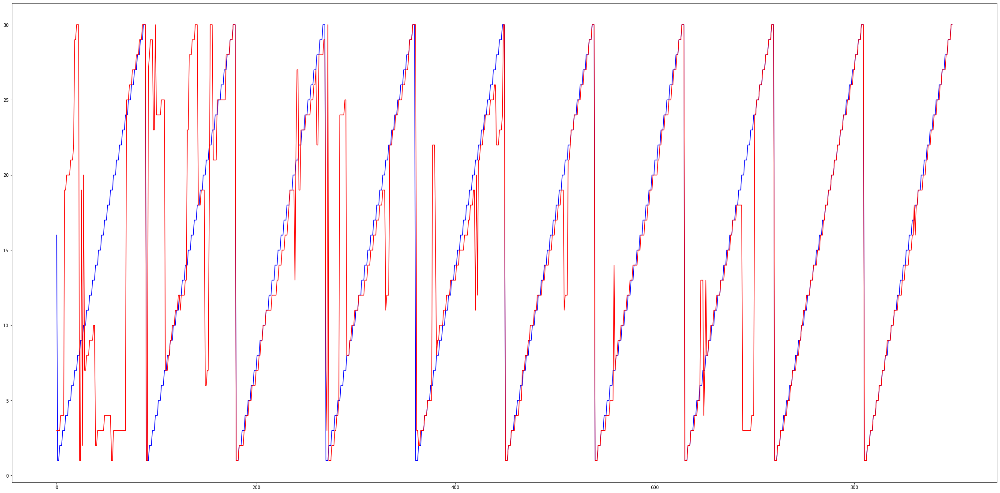

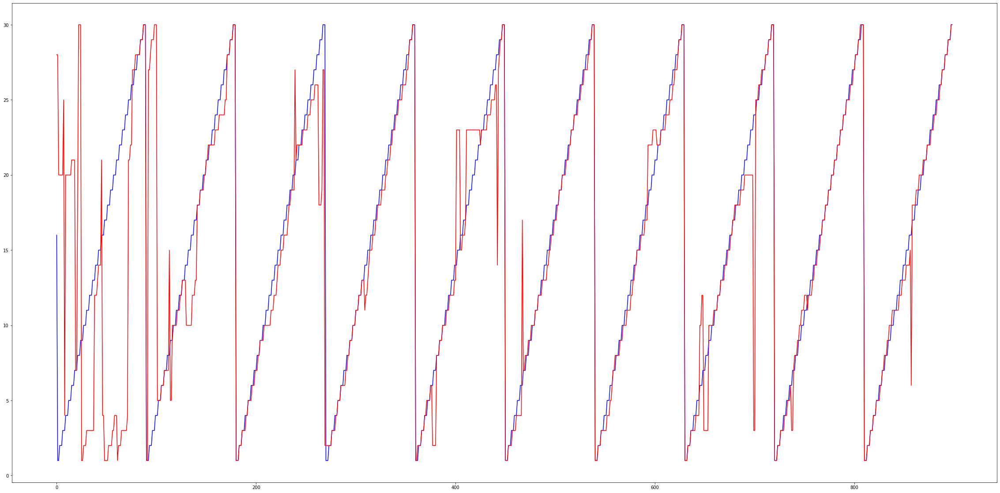

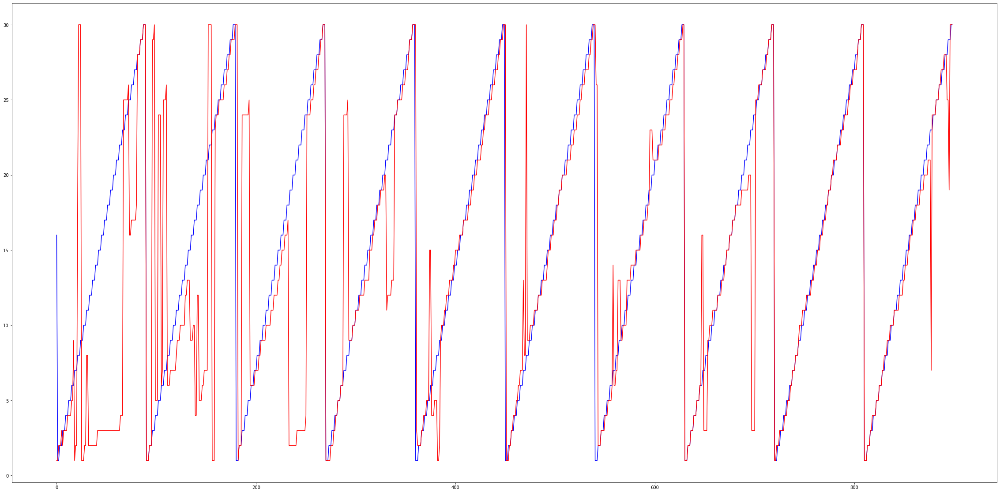

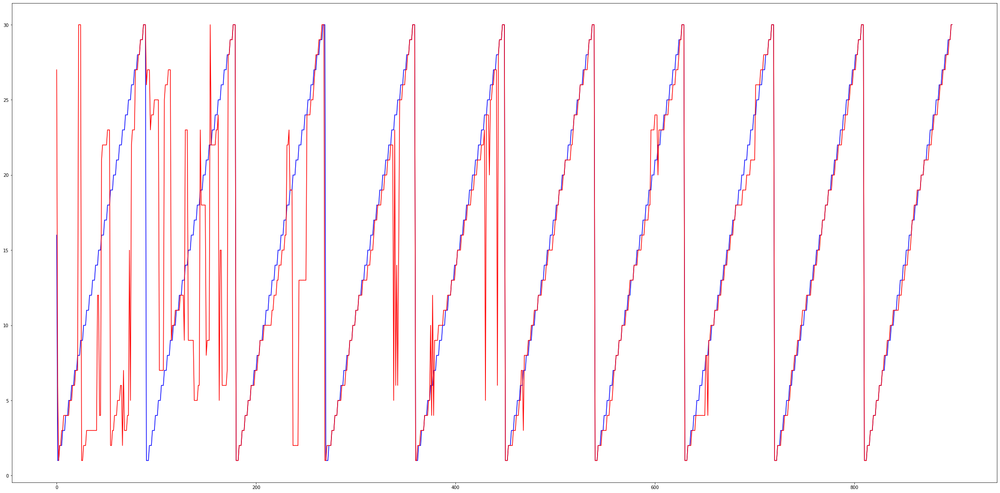

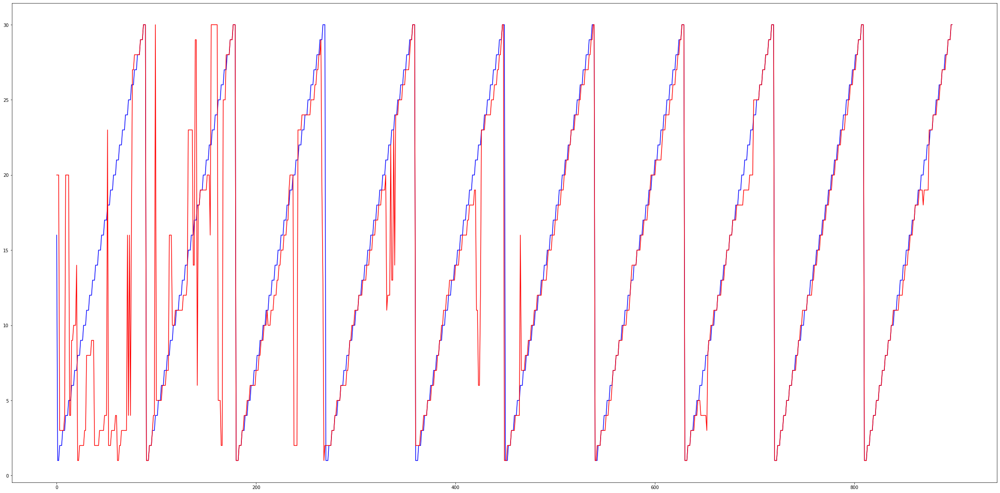

In [6]:
PC_num=150
nonPC_num=450
#PC_id=exp['PC_id']
PC_X=X[:,:,PC_id==True]
PC_X_v=X_v[:,:,PC_id==True]
PC_X_t=X_t[:,:,PC_id==True]

nPC_X=X[:,:,PC_id==False]
nPC_X_v=X_v[:,:,PC_id==False]
nPC_X_t=X_t[:,:,PC_id==False]

N_trial=5
N_laps=get_lap_id(y_valid).shape[0]

lap_s_test = np.zeros((N_trial, N_laps), dtype=np.float32)
lap_d_test = np.zeros((N_trial, N_laps), dtype=np.float32)

for i in range(N_trial):

    X_random1,X_v_random1,X_t_random1=get_random_sample(PC_X,PC_X_v,PC_X_t,PC_num)
    X_random2,X_v_random2,X_t_random2=get_random_sample(nPC_X,nPC_X_v,nPC_X_t,nonPC_num)

    X_random=np.concatenate([X_random1,X_random2],axis=2)
    X_v_random=np.concatenate([X_v_random1,X_v_random2],axis=2)
    X_t_random=np.concatenate([X_t_random1,X_t_random2],axis=2)
    
    X_train_set = X_random[bins_before:-1-bins_after, :, :]
    Y_train_set = Y[bins_before:-1-bins_after, :]
    X_valid_set = X_v_random[bins_before:-1-bins_after, :, :]
    Y_valid_set = Y_valid[bins_before:-1-bins_after, :]
    X_test_set = X_t_random[bins_before:-1-bins_after, :, :]
    
    
    
    
    root_dir = r'..\Neural_Decoding\training_models'
    model_path = os.path.join(root_dir, 'CA3_nday1_512x2_5x_150_450_'+str(i))
    LSTM_model=fit_LSTM(X_train_set, Y_train_set, X_valid_set, Y_valid_set,100, model_path, 
                          force=True)
    
    y_valid_predicted=LSTM_model.predict(X_valid_set)
    y_test_predicted=LSTM_model.predict(X_test_set)
    y_train_predicted=LSTM_model.predict(X_train_set)
    y_valid_pre_inverse=ohe.inverse_transform(y_valid_predicted)
    y_test_pre_inverse=ohe.inverse_transform(y_test_predicted)

    plt.figure(figsize=(40,20))
    plt.plot(test_group_pos[bins_before:-bins_after-1],'b')
    plt.plot(y_test_pre_inverse[:],'r')
    
    #lap_s,lap_d=compute_lap_score(X_v_random, y_valid,LSTM_model,bins_before,bins_after)
    lap_s_test[i],lap_d_test[i]=compute_lap_score(X_t_random, test_group_pos,LSTM_model,bins_before,bins_after)

In [13]:
lap_d_test

NameError: name 'lap_d_test' is not defined

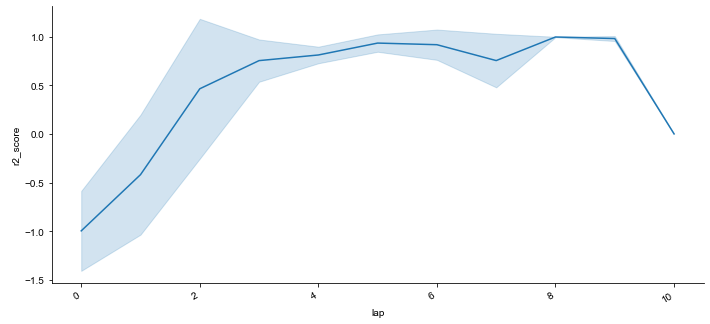

In [7]:
import pandas as pd
import seaborn as sns
pd_dict = [{'lap': i, 'trial': j, 'r2_score': lap_s_test[j,i], 'predict_error':lap_d_test[j,i]} for i in range(N_laps) for j in range(N_trial)]
          
# pprint(pd_dict)
pd_result = pd.DataFrame(pd_dict)


g = sns.relplot(x="lap", y="r2_score", kind="line",ci="sd", data=pd_result, aspect=2)
sns.set_style("white")
g.fig.autofmt_xdate()

In [8]:
np.save('groupca3nday1_score.npy', lap_s_test) # save
np.save('groupca3nday1__diff.npy', lap_d_test) # save

In [11]:
CA1_score= np.load('groupca1nday1_score.npy')
CA1_diff=np.load('groupca1nday1__diff.npy')

CA3_score= np.load('groupca3nday1_score.npy')
CA3_diff=np.load('groupca3nday1__diff.npy')

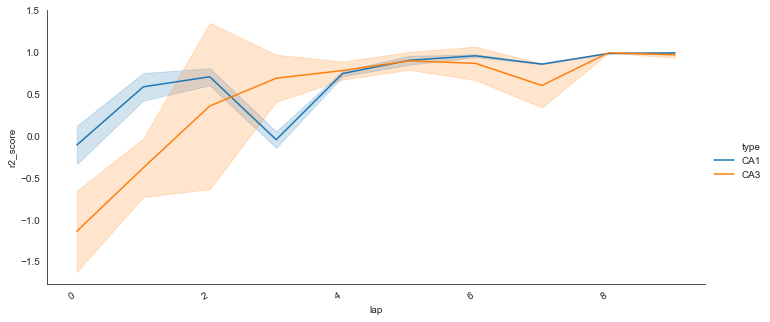

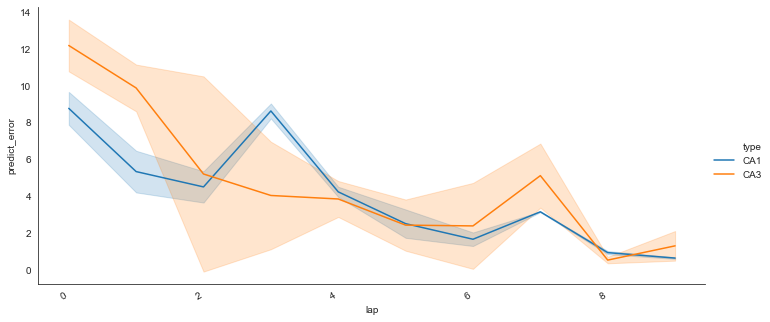

In [15]:
N_laps=CA3_score.shape[1]-1
N_trial=3
for t in range(2):
    if t==0:
        new_pd_dict = [{'lap': i, 'trial': j, 'r2_score': CA1_score[j,i], 'predict_error':np.sqrt(CA1_diff[j,i]),'type':'CA1'} for i in range(N_laps) for j in range(N_trial)]
    else:
        new_pd_dict += [{'lap': i, 'trial': j, 'r2_score': CA3_score[j,i], 'predict_error':np.sqrt(CA3_diff[j,i]),'type':'CA3'} for i in range(N_laps) for j in range(N_trial)]
        #new_pd_dict.update({'lap': i, 'trial': j, 'r2_score': lap_s_test[j,i], 'predict_error':lap_d_test[j,i],'type':'CA3'} for i in range(N_laps) for j in range(N_trial)})

            

#CA1_pd_dict = [{'lap': i, 'trial': j, 'r2_score': CA1_score[j,i], 'predict_error':CA1_diff[j,i],'type':1} for i in range(N_laps) for j in range(N_trial)]
#CA1_pd_result = pd.DataFrame(CA1_pd_dict)
new_pd_result = pd.DataFrame(new_pd_dict)

g = sns.relplot(x="lap", y="r2_score", kind="line",ci="sd",hue='type', data=new_pd_result, aspect=2)
#g = sns.relplot(x="lap", y="r2_score", kind="line",ci="sd", data=pd_result, aspect=2)
sns.set_style("white")
g.fig.autofmt_xdate()
g.savefig('CA1-CA3r2_group_nday1.png')
#plt.ylim(-4,1)

g = sns.relplot(x="lap", y="predict_error", kind="line",ci="sd",hue='type', data=new_pd_result, aspect=2)

#g = sns.relplot(x="lap", y="predict_error", kind="line",ci="sd", data=CA1_pd_result, aspect=2)
sns.set_style("white")
g.fig.autofmt_xdate()
#plt.ylim(0,18)
g.savefig('CA1-CA3diff_group_nday1.png')